# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
tf.enable_eager_execution ()
from tensorflow.keras import layers
import numpy as np
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1" 

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec



%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

config = tf.ConfigProto()
config.gpu_options.allow_growth = True

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

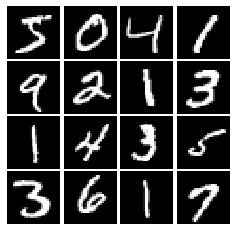

In [12]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [13]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [14]:
def test_leaky_relu(x, y_true):
        y = leaky_relu(tf.constant(x))
        print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [15]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random_uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [16]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    with tf.Session(config=config) as sess:
        z = sample_noise(batch_size, dim)
        # Check z has the correct shape
        assert z.get_shape().as_list() == [batch_size, dim]
        # Make sure z is a Tensor and not a numpy array
        assert isinstance(z, tf.Tensor)
        # Check that we get different noise for different evaluations
        z1 = sess.run(z)
        z2 = sess.run(z)
        assert not np.array_equal(z1, z2)
        # Check that we get the correct range
        assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
        print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [17]:
#from tensorflow.keras import initializers
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        layers.Dense(256, activation = layers.LeakyReLU(alpha=0.01), use_bias=True, input_shape=(784,)),      
        layers.Dense(256, use_bias=True,  activation= layers.LeakyReLU(alpha=0.01)),
        layers.Dense(1, use_bias=True, activation='linear'),
        
        #*****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [18]:
def test_discriminator(true_count=267009):
        model = discriminator()
        cur_count = count_params(model)
        if cur_count != true_count:
            print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
        else:
            print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [19]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        layers.Dense(1024, activation = 'relu', use_bias=True, input_shape=(noise_dim,)),      
        layers.Dense(1024, use_bias=True,  activation= 'relu'),
        layers.Dense(784, use_bias=True, activation='tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [20]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [21]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_loss = None
    
    labels_real = tf.ones_like(logits_real)
    labels_fake = tf.zeros_like(logits_fake)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_real, logits=logits_real))
    loss += tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_fake, logits=logits_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    G_loss = None
    labels_fake = tf.ones_like(logits_fake)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_fake, logits=logits_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [23]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):  
        d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
        print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [24]:
def test_generator_loss(logits_fake, g_loss_true):
        g_loss = generator_loss(tf.constant(logits_fake))
        print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [25]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    D_solver = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1)
    G_solver = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [26]:
# a giant helper function

def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    iter_count = 0
    tf.global_variables_initializer()
    for epoch in range(num_epochs):

            for (x, _) in mnist:      
                with tf.GradientTape() as tape:
                    real_data = x
                    logits_real = D(preprocess_img(real_data))

                    g_fake_seed = sample_noise(batch_size, noise_size)
                    fake_images = G(g_fake_seed)
                    logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                
                    d_total_error = discriminator_loss(logits_real, logits_fake)
                    
                    d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                    D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
                with tf.GradientTape() as tape:
                    g_fake_seed = sample_noise(batch_size, noise_size)
                    fake_images = G(g_fake_seed)

                    gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                    g_error = generator_loss(gen_logits_fake)
                    g_gradients = tape.gradient(g_error, G.trainable_variables)      
                    G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

                if (iter_count % show_every == 0):
                    print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                    imgs_numpy = fake_images.cpu().numpy()
                    show_images(imgs_numpy[0:16])
                    plt.show()
                iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.207, G:0.7262


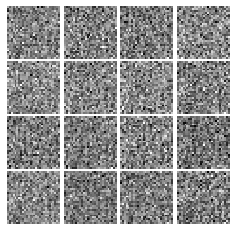

Epoch: 0, Iter: 20, D: 0.597, G:1.008


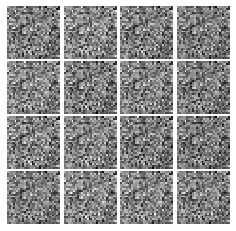

Epoch: 0, Iter: 40, D: 0.4585, G:1.27


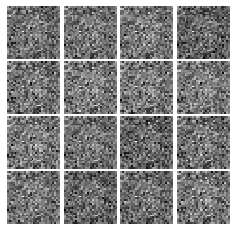

Epoch: 0, Iter: 60, D: 1.272, G:1.75


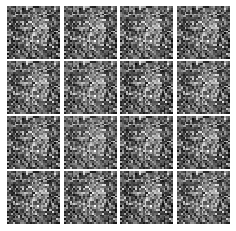

Epoch: 0, Iter: 80, D: 1.115, G:1.381


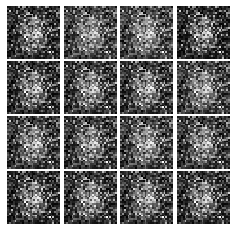

Epoch: 0, Iter: 100, D: 1.264, G:1.13


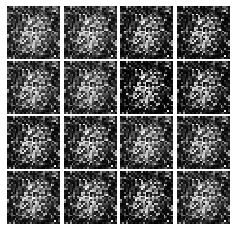

Epoch: 0, Iter: 120, D: 1.322, G:1.477


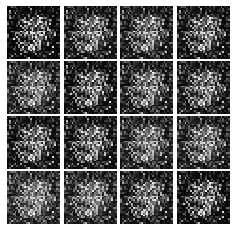

Epoch: 0, Iter: 140, D: 1.114, G:1.505


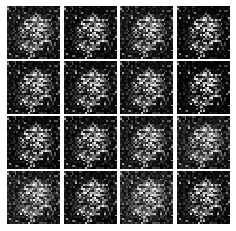

Epoch: 0, Iter: 160, D: 1.198, G:1.092


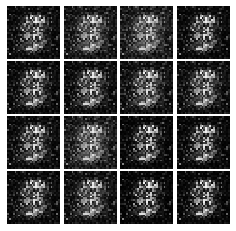

Epoch: 0, Iter: 180, D: 0.9759, G:1.788


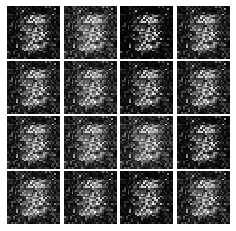

Epoch: 0, Iter: 200, D: 1.119, G:1.812


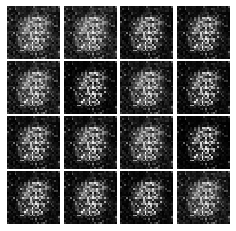

Epoch: 0, Iter: 220, D: 1.437, G:1.133


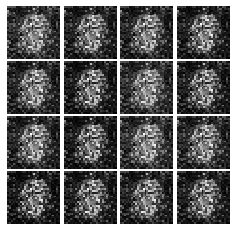

Epoch: 0, Iter: 240, D: 0.7732, G:1.522


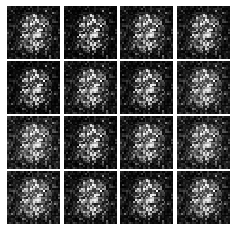

Epoch: 0, Iter: 260, D: 0.886, G:1.857


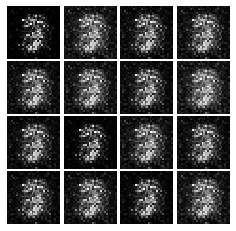

Epoch: 0, Iter: 280, D: 1.031, G:1.176


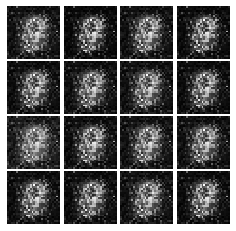

Epoch: 0, Iter: 300, D: 2.053, G:0.9153


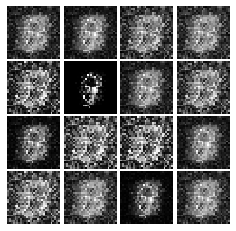

Epoch: 0, Iter: 320, D: 1.262, G:1.277


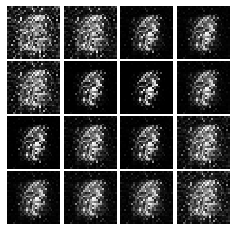

Epoch: 0, Iter: 340, D: 1.091, G:1.194


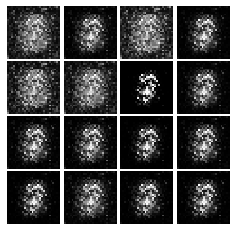

Epoch: 0, Iter: 360, D: 0.9591, G:2.287


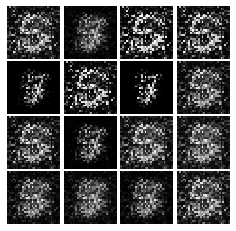

Epoch: 0, Iter: 380, D: 0.7592, G:1.59


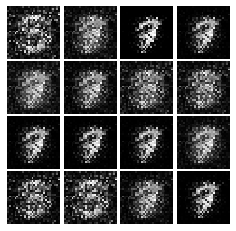

Epoch: 0, Iter: 400, D: 0.8805, G:1.555


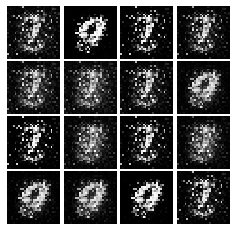

Epoch: 0, Iter: 420, D: 0.8443, G:4.446


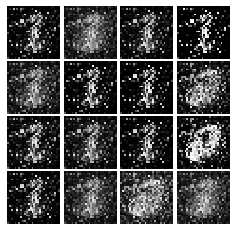

Epoch: 0, Iter: 440, D: 1.606, G:0.9448


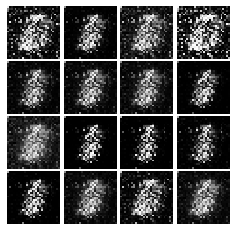

Epoch: 0, Iter: 460, D: 0.8249, G:1.914


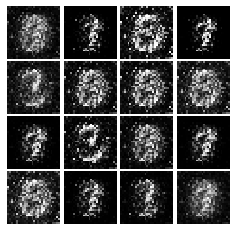

Epoch: 1, Iter: 480, D: 1.103, G:1.193


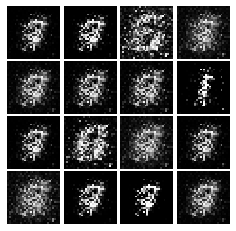

Epoch: 1, Iter: 500, D: 0.9875, G:1.311


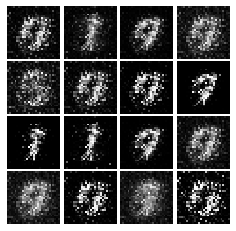

Epoch: 1, Iter: 520, D: 1.095, G:1.272


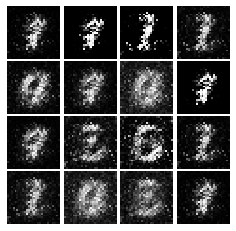

Epoch: 1, Iter: 540, D: 1.191, G:1.229


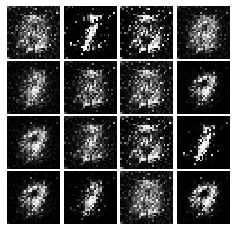

Epoch: 1, Iter: 560, D: 1.089, G:2.186


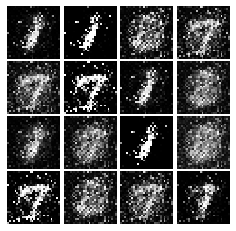

Epoch: 1, Iter: 580, D: 0.9486, G:1.556


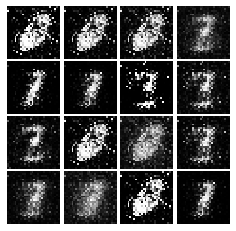

Epoch: 1, Iter: 600, D: 1.244, G:1.183


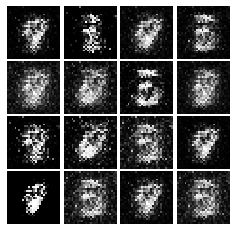

Epoch: 1, Iter: 620, D: 1.609, G:0.7358


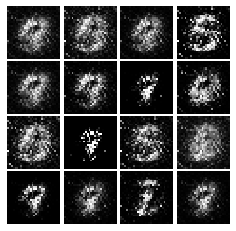

Epoch: 1, Iter: 640, D: 1.643, G:1.329


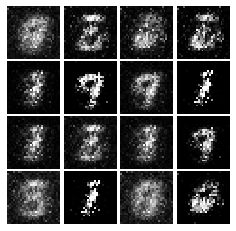

Epoch: 1, Iter: 660, D: 1.02, G:1.327


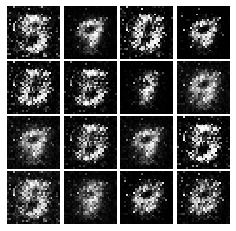

Epoch: 1, Iter: 680, D: 1.407, G:1.291


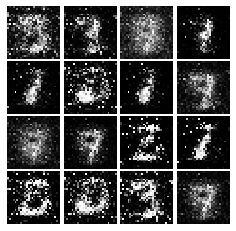

Epoch: 1, Iter: 700, D: 0.9997, G:1.247


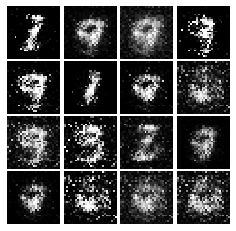

Epoch: 1, Iter: 720, D: 0.9862, G:1.304


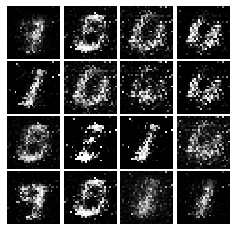

Epoch: 1, Iter: 740, D: 1.491, G:0.9082


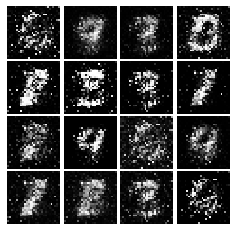

Epoch: 1, Iter: 760, D: 1.298, G:1.09


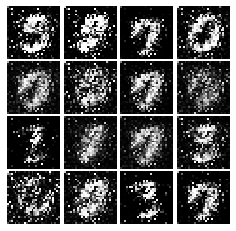

Epoch: 1, Iter: 780, D: 1.389, G:1.137


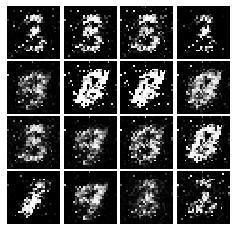

Epoch: 1, Iter: 800, D: 1.034, G:1.471


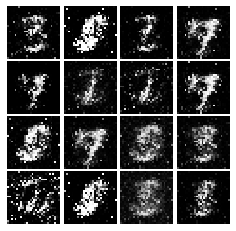

Epoch: 1, Iter: 820, D: 0.9626, G:1.053


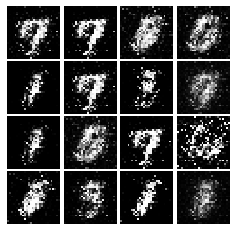

Epoch: 1, Iter: 840, D: 1.062, G:1.104


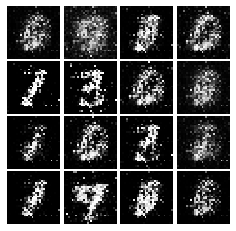

Epoch: 1, Iter: 860, D: 1.237, G:1.003


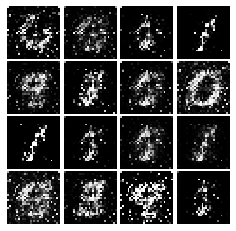

Epoch: 1, Iter: 880, D: 1.085, G:1.095


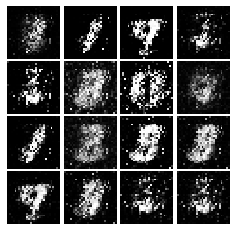

Epoch: 1, Iter: 900, D: 1.1, G:0.9529


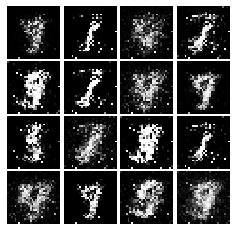

Epoch: 1, Iter: 920, D: 1.274, G:1.034


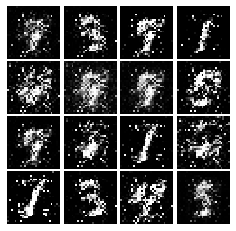

Epoch: 2, Iter: 940, D: 1.602, G:1.661


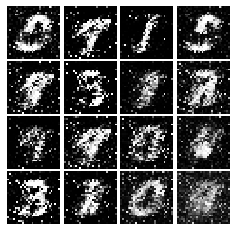

Epoch: 2, Iter: 960, D: 1.205, G:0.9222


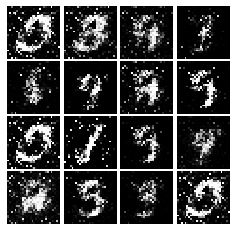

Epoch: 2, Iter: 980, D: 1.161, G:1.453


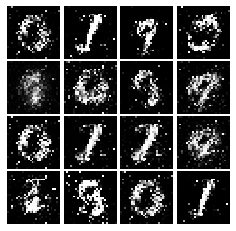

Epoch: 2, Iter: 1000, D: 1.497, G:1.083


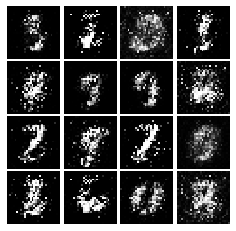

Epoch: 2, Iter: 1020, D: 1.0, G:1.811


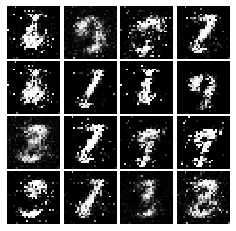

Epoch: 2, Iter: 1040, D: 1.15, G:1.282


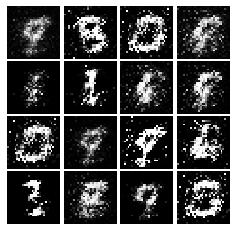

Epoch: 2, Iter: 1060, D: 1.243, G:0.4064


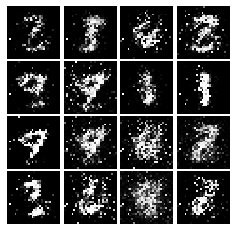

Epoch: 2, Iter: 1080, D: 1.241, G:1.008


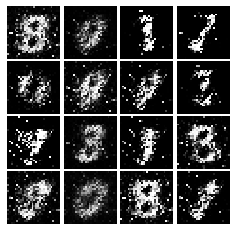

Epoch: 2, Iter: 1100, D: 1.22, G:1.433


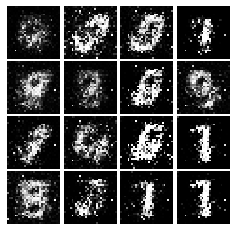

Epoch: 2, Iter: 1120, D: 1.224, G:2.414


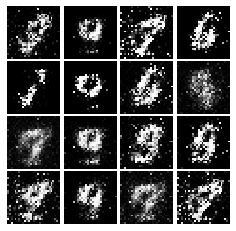

Epoch: 2, Iter: 1140, D: 0.9881, G:1.331


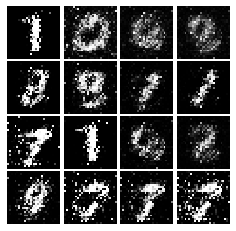

Epoch: 2, Iter: 1160, D: 1.293, G:1.039


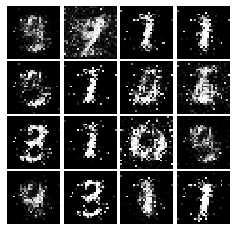

Epoch: 2, Iter: 1180, D: 1.165, G:0.9954


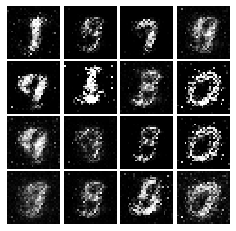

Epoch: 2, Iter: 1200, D: 1.476, G:1.153


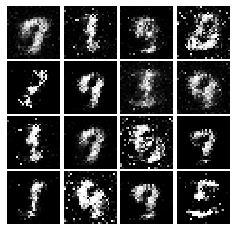

Epoch: 2, Iter: 1220, D: 1.702, G:0.9616


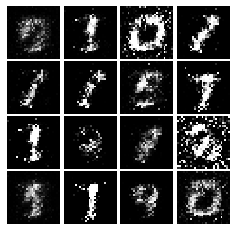

Epoch: 2, Iter: 1240, D: 1.248, G:0.9164


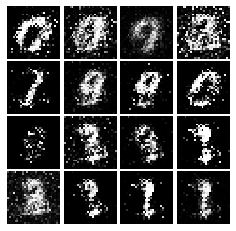

Epoch: 2, Iter: 1260, D: 1.174, G:1.542


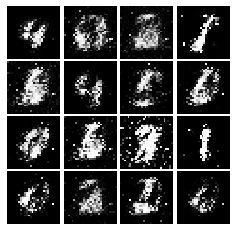

Epoch: 2, Iter: 1280, D: 1.27, G:1.414


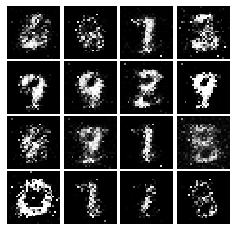

Epoch: 2, Iter: 1300, D: 1.223, G:1.04


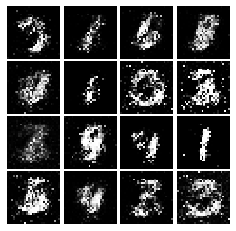

Epoch: 2, Iter: 1320, D: 1.339, G:0.9151


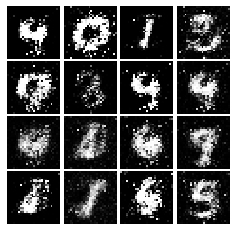

Epoch: 2, Iter: 1340, D: 1.351, G:0.8783


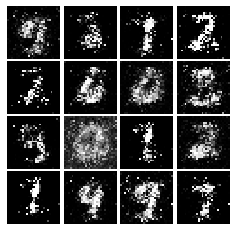

Epoch: 2, Iter: 1360, D: 1.266, G:0.9178


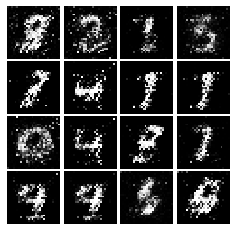

Epoch: 2, Iter: 1380, D: 1.564, G:0.7468


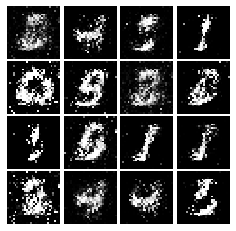

Epoch: 2, Iter: 1400, D: 1.288, G:0.796


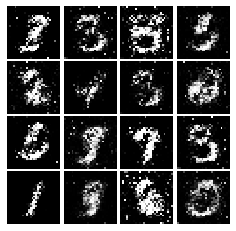

Epoch: 3, Iter: 1420, D: 1.266, G:1.109


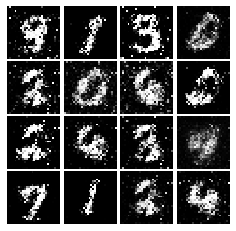

Epoch: 3, Iter: 1440, D: 1.284, G:0.9411


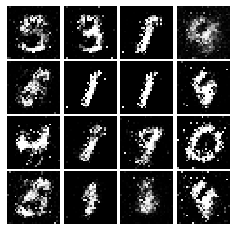

Epoch: 3, Iter: 1460, D: 1.131, G:1.315


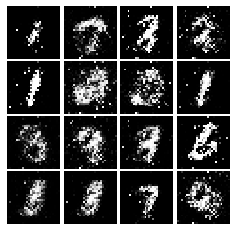

Epoch: 3, Iter: 1480, D: 1.364, G:0.9846


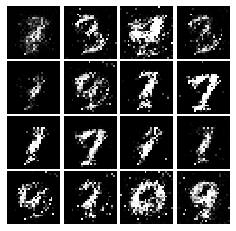

Epoch: 3, Iter: 1500, D: 1.244, G:1.024


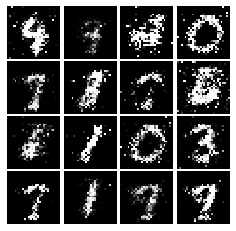

Epoch: 3, Iter: 1520, D: 1.23, G:0.806


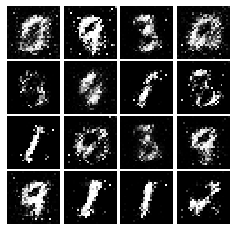

Epoch: 3, Iter: 1540, D: 1.182, G:0.8599


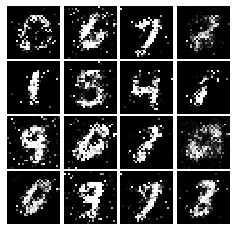

Epoch: 3, Iter: 1560, D: 1.159, G:1.013


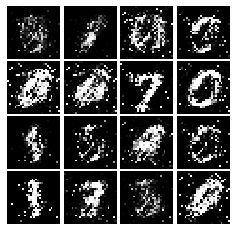

Epoch: 3, Iter: 1580, D: 1.225, G:1.074


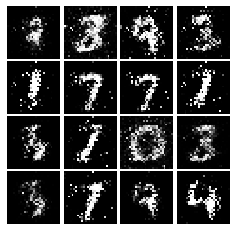

Epoch: 3, Iter: 1600, D: 1.156, G:1.064


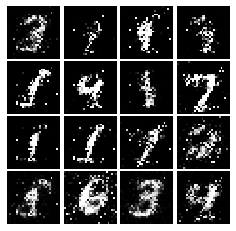

Epoch: 3, Iter: 1620, D: 1.241, G:1.086


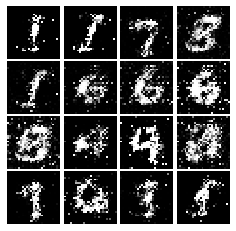

Epoch: 3, Iter: 1640, D: 1.323, G:0.9914


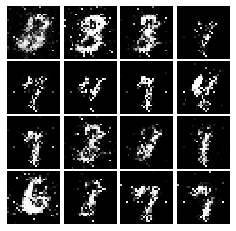

Epoch: 3, Iter: 1660, D: 1.229, G:1.169


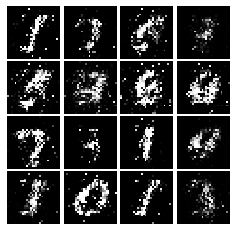

Epoch: 3, Iter: 1680, D: 1.194, G:1.253


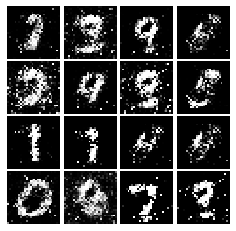

Epoch: 3, Iter: 1700, D: 1.327, G:0.8617


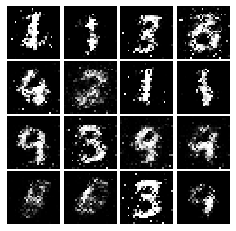

Epoch: 3, Iter: 1720, D: 1.149, G:1.188


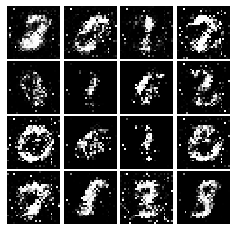

Epoch: 3, Iter: 1740, D: 1.288, G:1.127


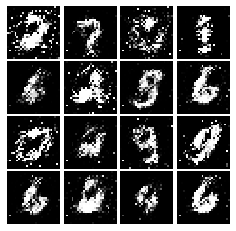

Epoch: 3, Iter: 1760, D: 1.143, G:1.056


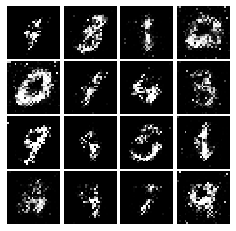

Epoch: 3, Iter: 1780, D: 1.19, G:0.9515


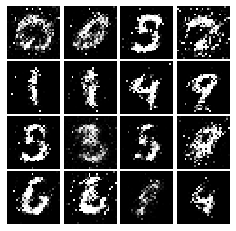

Epoch: 3, Iter: 1800, D: 1.231, G:0.8192


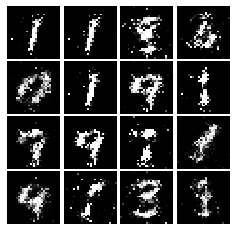

Epoch: 3, Iter: 1820, D: 1.28, G:0.8754


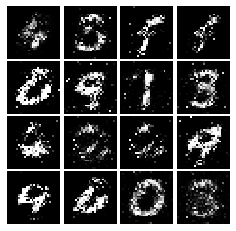

Epoch: 3, Iter: 1840, D: 1.149, G:1.002


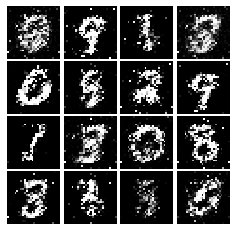

Epoch: 3, Iter: 1860, D: 1.327, G:0.8566


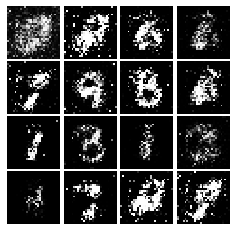

Epoch: 4, Iter: 1880, D: 1.403, G:0.8862


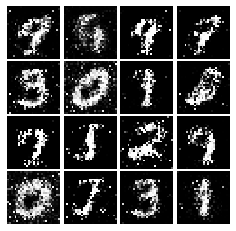

Epoch: 4, Iter: 1900, D: 1.264, G:0.9338


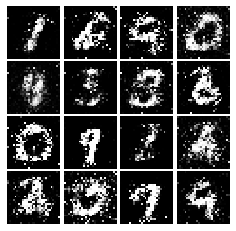

Epoch: 4, Iter: 1920, D: 1.294, G:0.9441


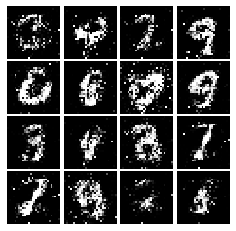

Epoch: 4, Iter: 1940, D: 1.18, G:1.086


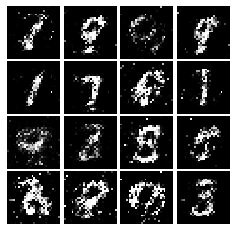

Epoch: 4, Iter: 1960, D: 1.239, G:1.001


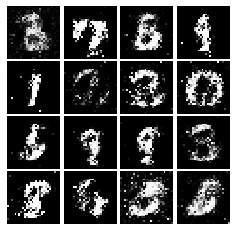

Epoch: 4, Iter: 1980, D: 1.314, G:0.9772


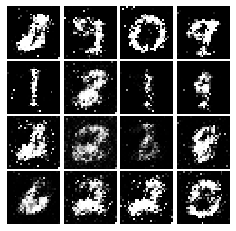

Epoch: 4, Iter: 2000, D: 1.234, G:0.8671


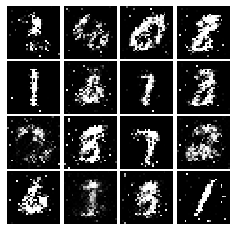

Epoch: 4, Iter: 2020, D: 1.297, G:0.7592


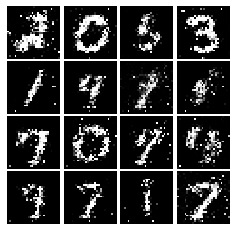

Epoch: 4, Iter: 2040, D: 1.277, G:0.8087


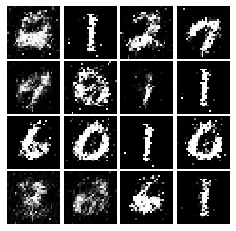

Epoch: 4, Iter: 2060, D: 1.323, G:0.8591


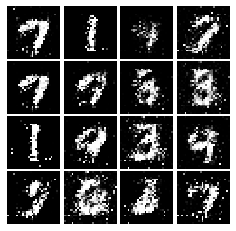

Epoch: 4, Iter: 2080, D: 1.227, G:0.9221


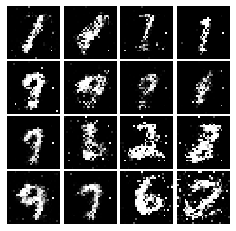

Epoch: 4, Iter: 2100, D: 1.325, G:0.8307


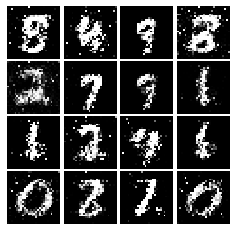

Epoch: 4, Iter: 2120, D: 1.475, G:0.4872


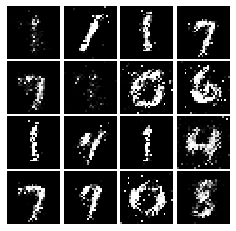

Epoch: 4, Iter: 2140, D: 1.27, G:0.8459


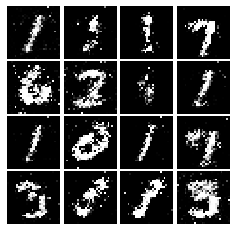

Epoch: 4, Iter: 2160, D: 1.463, G:0.8423


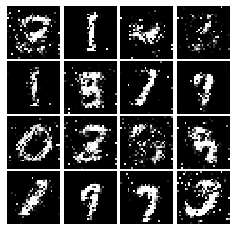

Epoch: 4, Iter: 2180, D: 1.305, G:0.8306


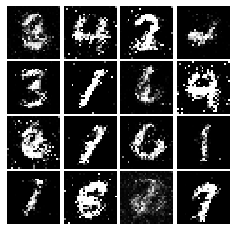

Epoch: 4, Iter: 2200, D: 1.233, G:1.009


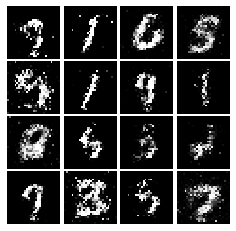

Epoch: 4, Iter: 2220, D: 1.292, G:0.9913


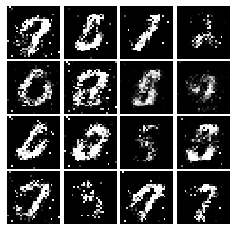

Epoch: 4, Iter: 2240, D: 1.335, G:0.9024


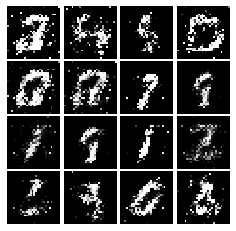

Epoch: 4, Iter: 2260, D: 1.212, G:1.285


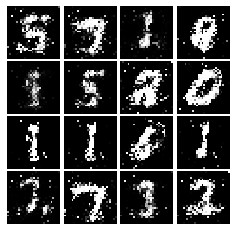

Epoch: 4, Iter: 2280, D: 1.208, G:1.116


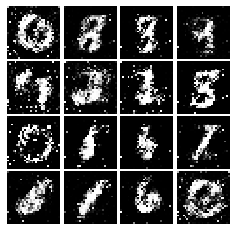

Epoch: 4, Iter: 2300, D: 1.322, G:0.7601


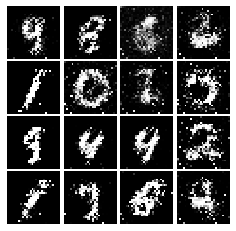

Epoch: 4, Iter: 2320, D: 1.246, G:1.065


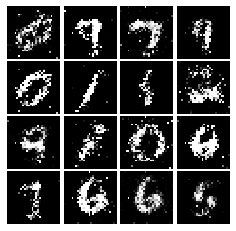

Epoch: 4, Iter: 2340, D: 1.135, G:0.893


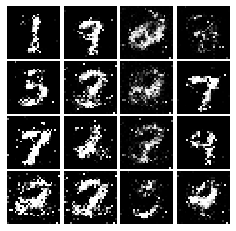

Epoch: 5, Iter: 2360, D: 1.168, G:0.954


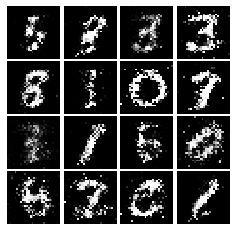

Epoch: 5, Iter: 2380, D: 1.305, G:0.9466


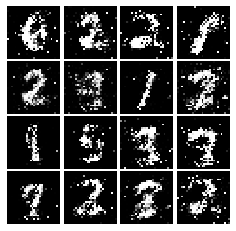

Epoch: 5, Iter: 2400, D: 1.352, G:0.8336


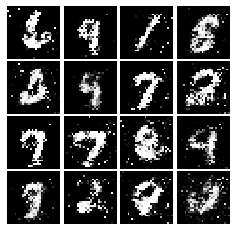

Epoch: 5, Iter: 2420, D: 1.26, G:0.997


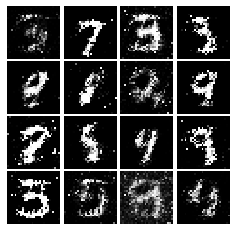

Epoch: 5, Iter: 2440, D: 1.286, G:0.8185


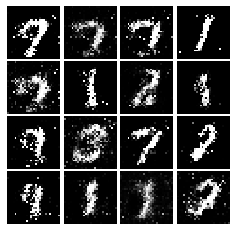

Epoch: 5, Iter: 2460, D: 1.193, G:1.709


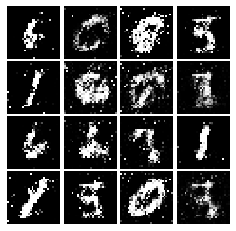

Epoch: 5, Iter: 2480, D: 1.3, G:0.8372


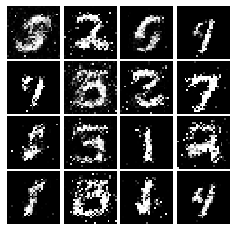

Epoch: 5, Iter: 2500, D: 1.179, G:1.013


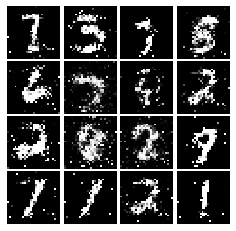

Epoch: 5, Iter: 2520, D: 1.412, G:1.036


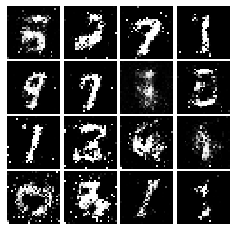

Epoch: 5, Iter: 2540, D: 1.268, G:0.9057


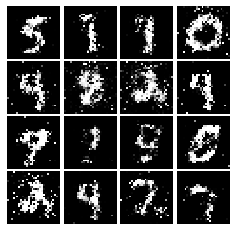

Epoch: 5, Iter: 2560, D: 1.26, G:0.9386


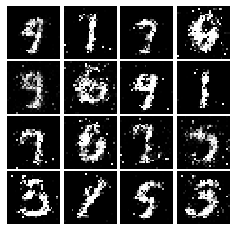

Epoch: 5, Iter: 2580, D: 1.184, G:0.8846


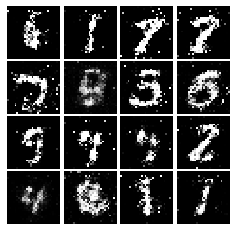

Epoch: 5, Iter: 2600, D: 1.42, G:0.74


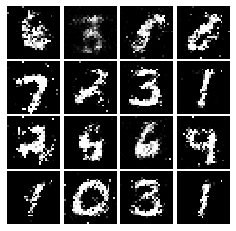

Epoch: 5, Iter: 2620, D: 1.258, G:0.8873


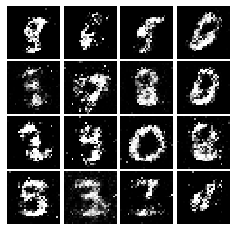

Epoch: 5, Iter: 2640, D: 1.272, G:0.9837


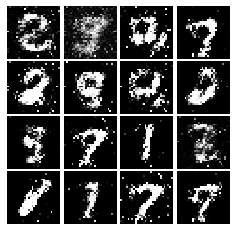

Epoch: 5, Iter: 2660, D: 1.238, G:0.9081


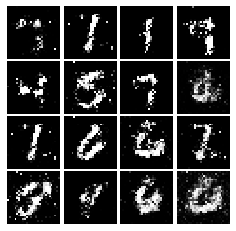

Epoch: 5, Iter: 2680, D: 1.357, G:0.8474


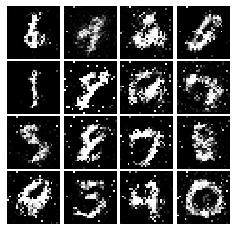

Epoch: 5, Iter: 2700, D: 1.385, G:0.831


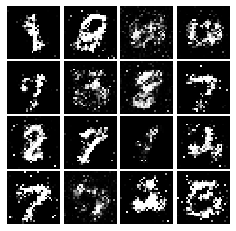

Epoch: 5, Iter: 2720, D: 1.306, G:0.7948


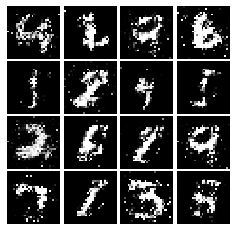

Epoch: 5, Iter: 2740, D: 1.397, G:0.7707


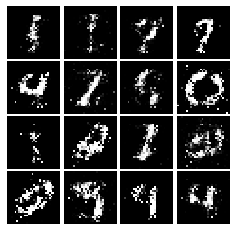

Epoch: 5, Iter: 2760, D: 1.37, G:0.8626


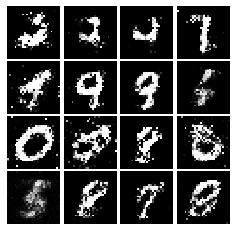

Epoch: 5, Iter: 2780, D: 1.267, G:0.7901


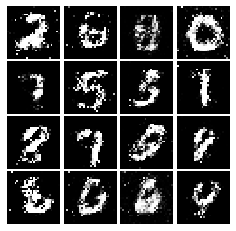

Epoch: 5, Iter: 2800, D: 1.264, G:0.9123


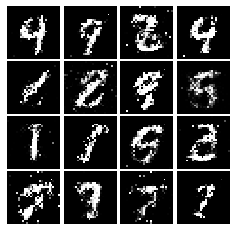

Epoch: 6, Iter: 2820, D: 1.321, G:0.8467


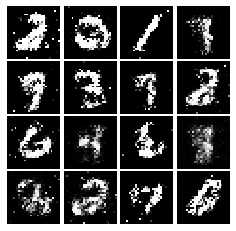

Epoch: 6, Iter: 2840, D: 1.283, G:0.873


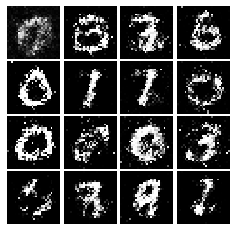

Epoch: 6, Iter: 2860, D: 1.307, G:0.8917


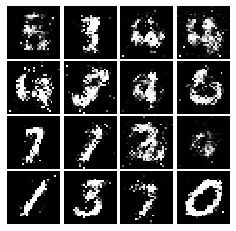

Epoch: 6, Iter: 2880, D: 1.198, G:1.101


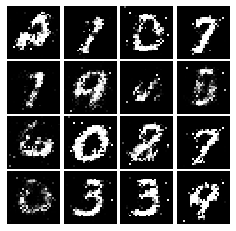

Epoch: 6, Iter: 2900, D: 1.315, G:0.7664


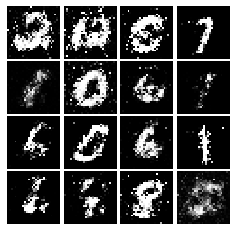

Epoch: 6, Iter: 2920, D: 1.393, G:0.7699


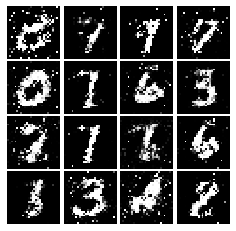

Epoch: 6, Iter: 2940, D: 1.354, G:0.8666


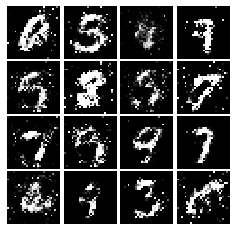

Epoch: 6, Iter: 2960, D: 1.28, G:0.8401


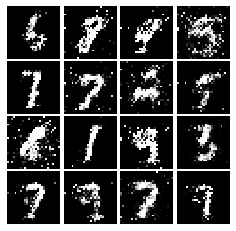

Epoch: 6, Iter: 2980, D: 1.306, G:0.8967


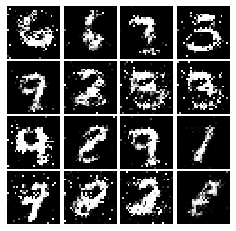

Epoch: 6, Iter: 3000, D: 1.299, G:0.84


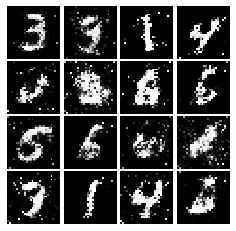

Epoch: 6, Iter: 3020, D: 1.352, G:0.8125


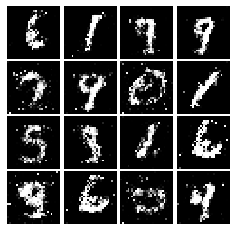

Epoch: 6, Iter: 3040, D: 1.279, G:0.7919


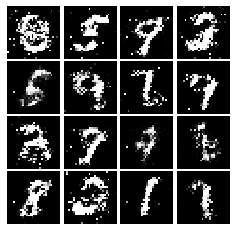

Epoch: 6, Iter: 3060, D: 1.331, G:0.7544


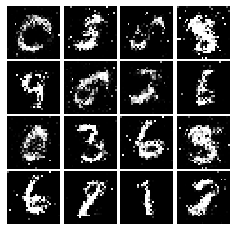

Epoch: 6, Iter: 3080, D: 1.305, G:0.8101


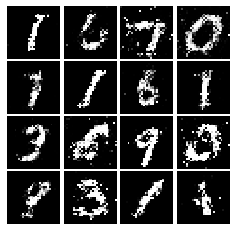

Epoch: 6, Iter: 3100, D: 1.312, G:0.8027


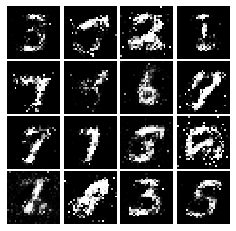

Epoch: 6, Iter: 3120, D: 1.35, G:0.7582


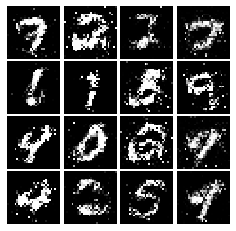

Epoch: 6, Iter: 3140, D: 1.334, G:0.8191


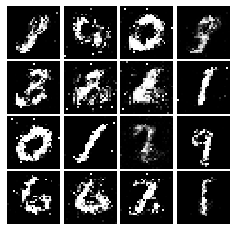

Epoch: 6, Iter: 3160, D: 1.364, G:0.7384


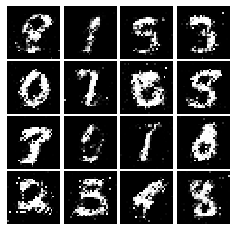

Epoch: 6, Iter: 3180, D: 1.305, G:0.7084


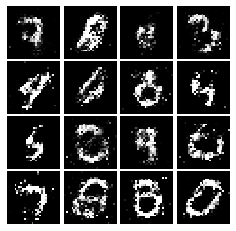

Epoch: 6, Iter: 3200, D: 1.327, G:0.7977


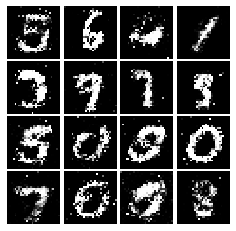

Epoch: 6, Iter: 3220, D: 1.376, G:0.8481


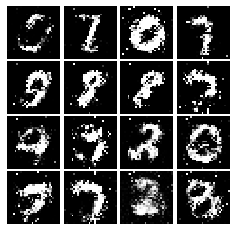

Epoch: 6, Iter: 3240, D: 1.313, G:0.8354


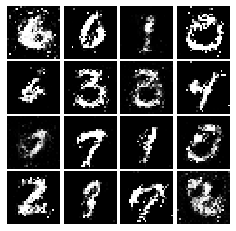

Epoch: 6, Iter: 3260, D: 1.367, G:0.7942


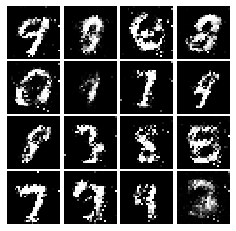

Epoch: 6, Iter: 3280, D: 1.312, G:0.7963


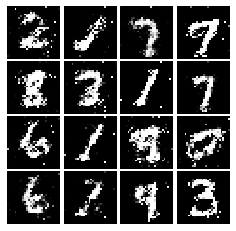

Epoch: 7, Iter: 3300, D: 1.276, G:0.8923


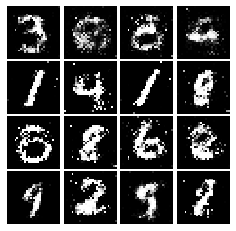

Epoch: 7, Iter: 3320, D: 1.338, G:0.758


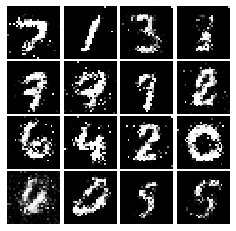

Epoch: 7, Iter: 3340, D: 1.289, G:0.9136


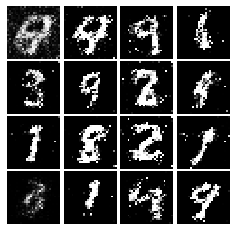

Epoch: 7, Iter: 3360, D: 1.332, G:0.8619


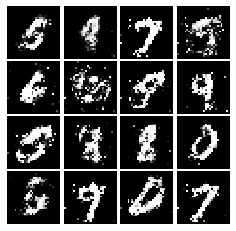

Epoch: 7, Iter: 3380, D: 1.445, G:0.5358


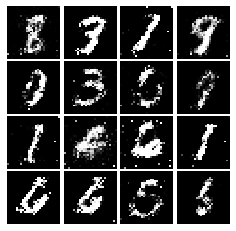

Epoch: 7, Iter: 3400, D: 1.458, G:0.8447


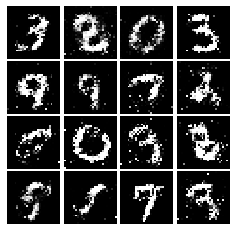

Epoch: 7, Iter: 3420, D: 1.348, G:0.7741


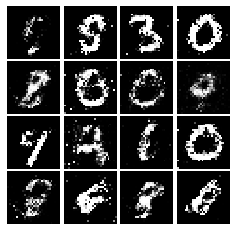

Epoch: 7, Iter: 3440, D: 1.292, G:0.764


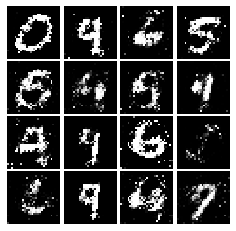

Epoch: 7, Iter: 3460, D: 1.362, G:0.8011


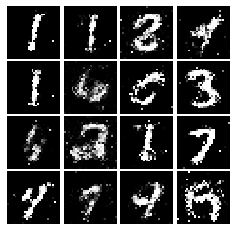

Epoch: 7, Iter: 3480, D: 1.32, G:0.7151


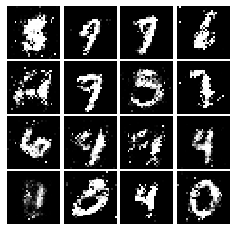

Epoch: 7, Iter: 3500, D: 1.334, G:0.8451


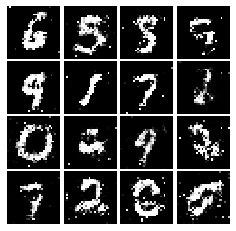

Epoch: 7, Iter: 3520, D: 1.322, G:0.7316


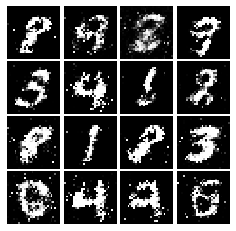

Epoch: 7, Iter: 3540, D: 1.413, G:0.8203


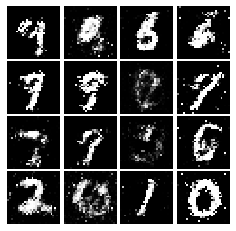

Epoch: 7, Iter: 3560, D: 1.32, G:0.9067


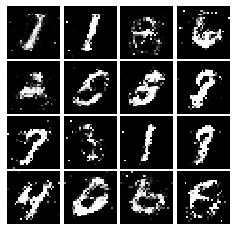

Epoch: 7, Iter: 3580, D: 1.283, G:0.8259


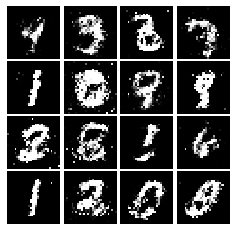

Epoch: 7, Iter: 3600, D: 1.361, G:0.8498


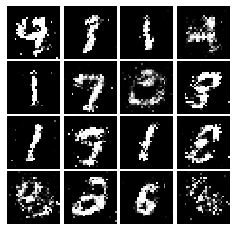

Epoch: 7, Iter: 3620, D: 1.387, G:0.8144


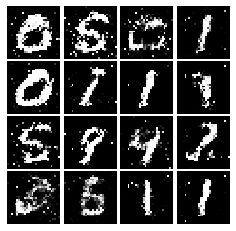

Epoch: 7, Iter: 3640, D: 1.324, G:0.7452


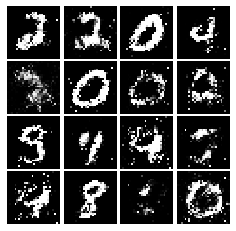

Epoch: 7, Iter: 3660, D: 1.317, G:0.7547


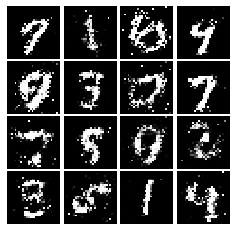

Epoch: 7, Iter: 3680, D: 1.372, G:0.7653


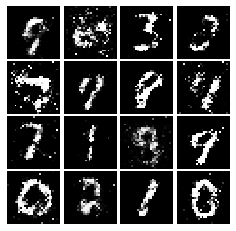

Epoch: 7, Iter: 3700, D: 1.292, G:0.8139


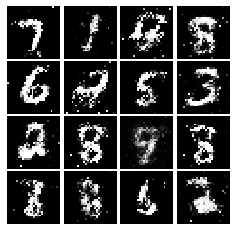

Epoch: 7, Iter: 3720, D: 1.274, G:0.7712


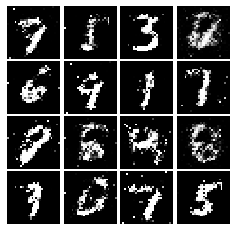

Epoch: 7, Iter: 3740, D: 1.336, G:0.785


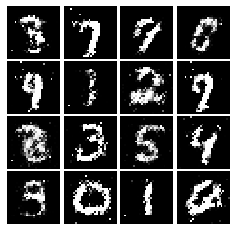

Epoch: 8, Iter: 3760, D: 1.377, G:0.8027


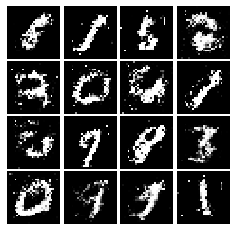

Epoch: 8, Iter: 3780, D: 1.395, G:0.7988


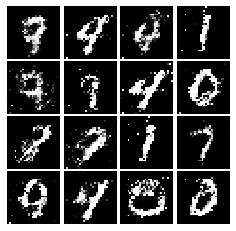

Epoch: 8, Iter: 3800, D: 1.221, G:0.7953


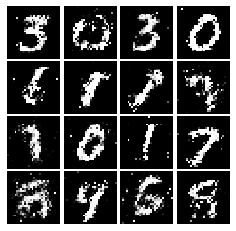

Epoch: 8, Iter: 3820, D: 1.335, G:0.7846


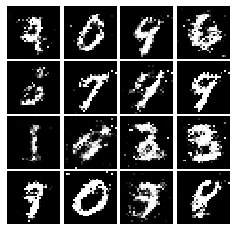

Epoch: 8, Iter: 3840, D: 1.338, G:0.811


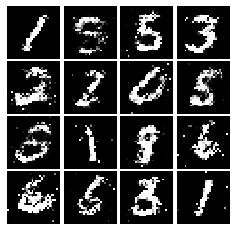

Epoch: 8, Iter: 3860, D: 1.288, G:0.7853


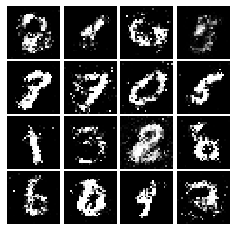

Epoch: 8, Iter: 3880, D: 1.32, G:0.7461


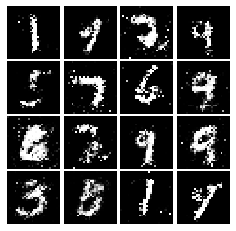

Epoch: 8, Iter: 3900, D: 1.348, G:0.771


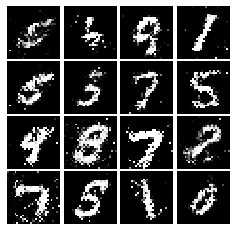

Epoch: 8, Iter: 3920, D: 1.305, G:0.7922


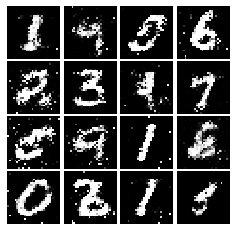

Epoch: 8, Iter: 3940, D: 1.366, G:0.767


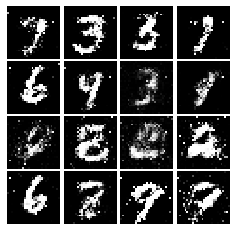

Epoch: 8, Iter: 3960, D: 1.308, G:0.7844


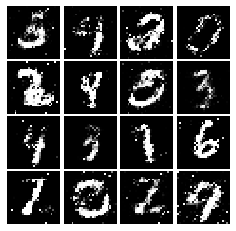

Epoch: 8, Iter: 3980, D: 1.364, G:0.8959


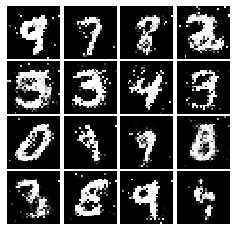

Epoch: 8, Iter: 4000, D: 1.265, G:0.7295


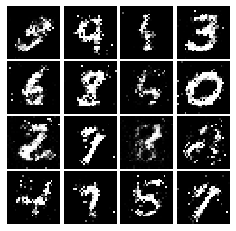

Epoch: 8, Iter: 4020, D: 1.411, G:0.6995


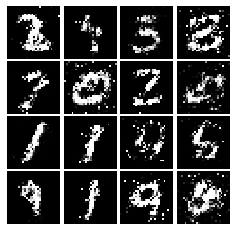

Epoch: 8, Iter: 4040, D: 1.28, G:0.8053


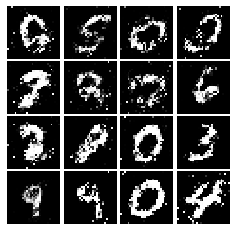

Epoch: 8, Iter: 4060, D: 1.335, G:0.786


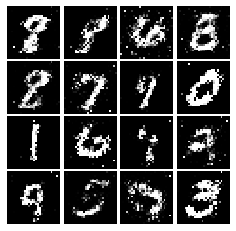

Epoch: 8, Iter: 4080, D: 1.439, G:0.9576


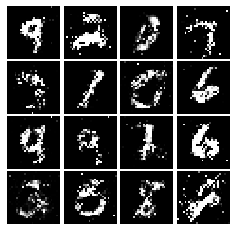

Epoch: 8, Iter: 4100, D: 1.306, G:0.7202


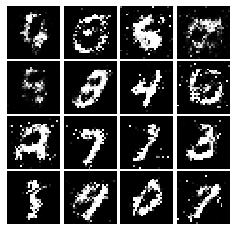

Epoch: 8, Iter: 4120, D: 1.432, G:0.7484


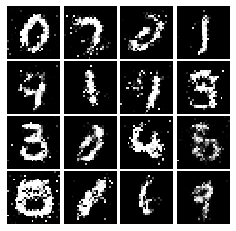

Epoch: 8, Iter: 4140, D: 1.355, G:0.7963


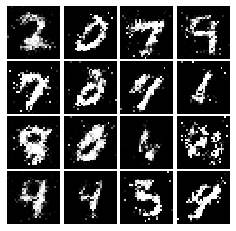

Epoch: 8, Iter: 4160, D: 1.339, G:0.9348


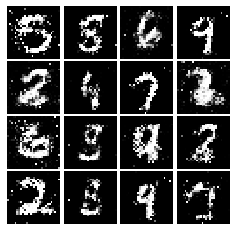

Epoch: 8, Iter: 4180, D: 1.332, G:0.8721


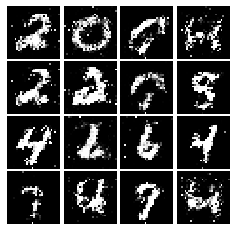

Epoch: 8, Iter: 4200, D: 1.433, G:0.7396


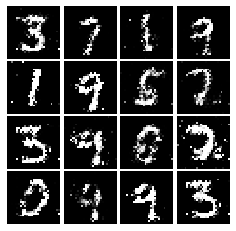

Epoch: 8, Iter: 4220, D: 1.419, G:0.8027


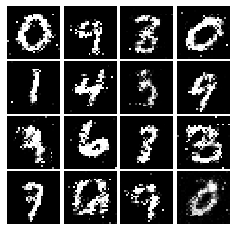

Epoch: 9, Iter: 4240, D: 1.383, G:0.77


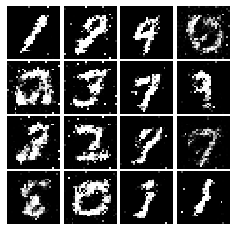

Epoch: 9, Iter: 4260, D: 1.405, G:0.7642


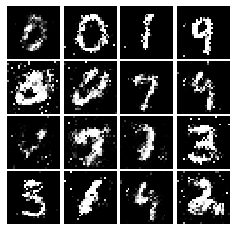

Epoch: 9, Iter: 4280, D: 1.293, G:0.7743


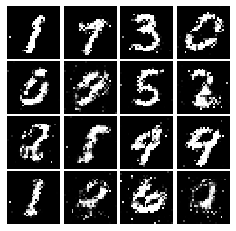

Epoch: 9, Iter: 4300, D: 1.335, G:0.7823


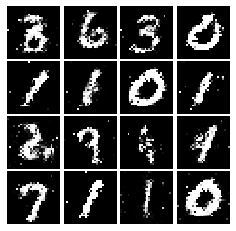

Epoch: 9, Iter: 4320, D: 1.358, G:0.7604


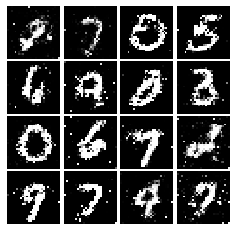

Epoch: 9, Iter: 4340, D: 1.396, G:0.7786


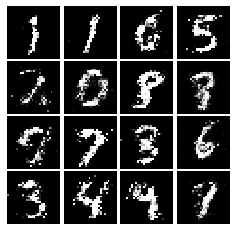

Epoch: 9, Iter: 4360, D: 1.333, G:0.6941


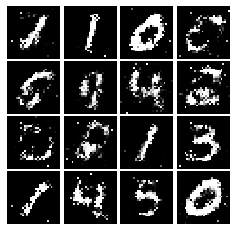

Epoch: 9, Iter: 4380, D: 1.354, G:0.7955


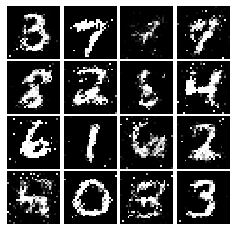

Epoch: 9, Iter: 4400, D: 1.287, G:0.7078


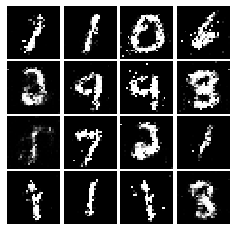

Epoch: 9, Iter: 4420, D: 1.308, G:0.7199


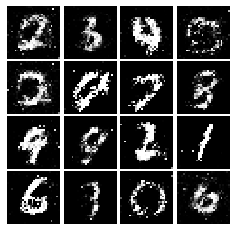

Epoch: 9, Iter: 4440, D: 1.404, G:0.7691


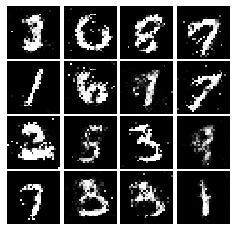

Epoch: 9, Iter: 4460, D: 1.329, G:0.7399


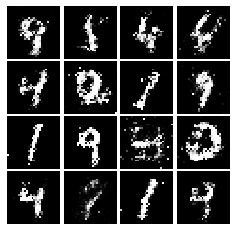

Epoch: 9, Iter: 4480, D: 1.322, G:0.8346


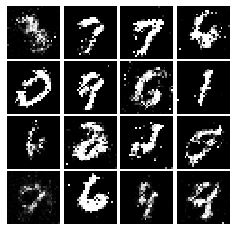

Epoch: 9, Iter: 4500, D: 1.431, G:0.8241


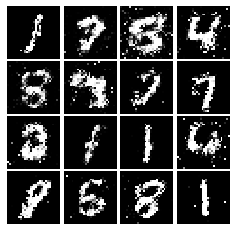

Epoch: 9, Iter: 4520, D: 1.323, G:0.7804


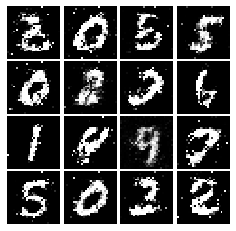

Epoch: 9, Iter: 4540, D: 1.452, G:0.786


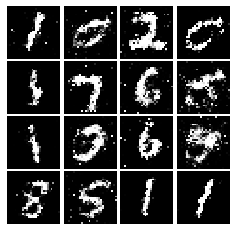

Epoch: 9, Iter: 4560, D: 1.349, G:0.7493


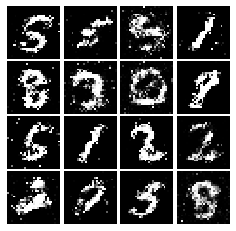

Epoch: 9, Iter: 4580, D: 1.411, G:0.7938


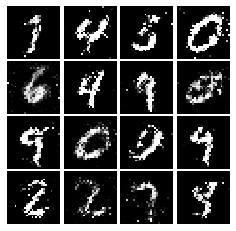

Epoch: 9, Iter: 4600, D: 1.368, G:0.6956


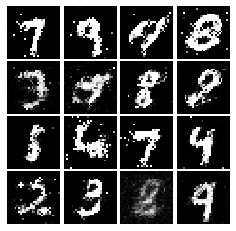

Epoch: 9, Iter: 4620, D: 1.375, G:0.7598


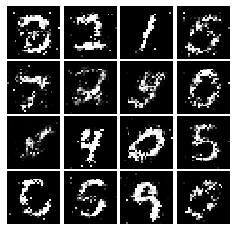

Epoch: 9, Iter: 4640, D: 1.338, G:0.7919


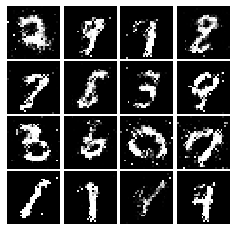

Epoch: 9, Iter: 4660, D: 1.363, G:0.7636


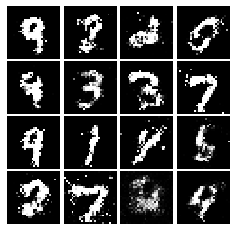

Epoch: 9, Iter: 4680, D: 1.518, G:0.6822


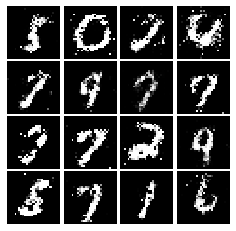

Final images


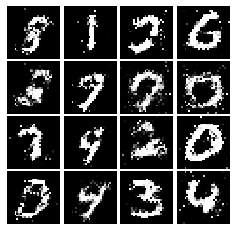

In [27]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [30]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
    loss = 0.5 *tf.reduce_mean (tf.square(scores_real -1))+0.5 *tf.reduce_mean(tf.square(scores_fake))
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 *tf.reduce_mean (tf.square(scores_fake -1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [31]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.396, G:0.4088


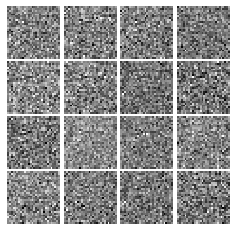

Epoch: 0, Iter: 20, D: 0.01904, G:0.8622


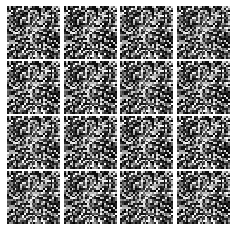

Epoch: 0, Iter: 40, D: 0.02099, G:0.7436


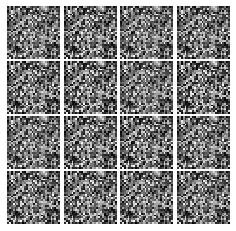

Epoch: 0, Iter: 60, D: 0.08547, G:0.9529


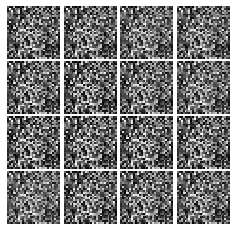

Epoch: 0, Iter: 80, D: 0.03058, G:0.7591


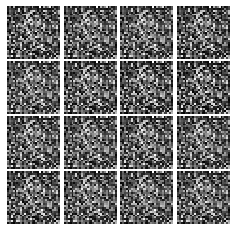

Epoch: 0, Iter: 100, D: 0.1022, G:0.2087


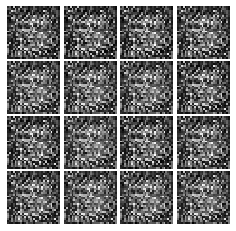

Epoch: 0, Iter: 120, D: 0.06127, G:1.282


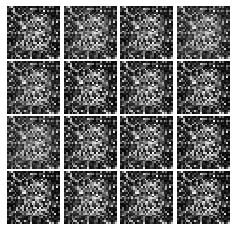

Epoch: 0, Iter: 140, D: 0.1388, G:0.4192


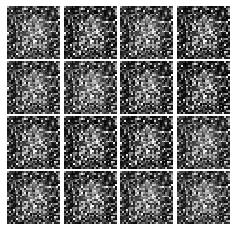

Epoch: 0, Iter: 160, D: 0.1847, G:0.08162


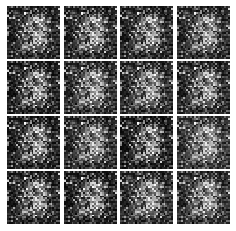

Epoch: 0, Iter: 180, D: 0.08657, G:0.474


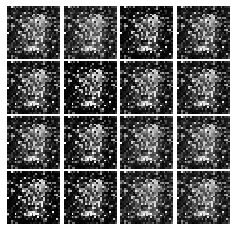

Epoch: 0, Iter: 200, D: 0.4761, G:0.7252


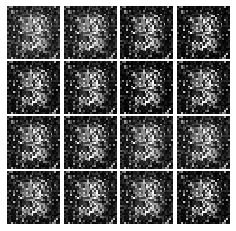

Epoch: 0, Iter: 220, D: 0.4622, G:0.4511


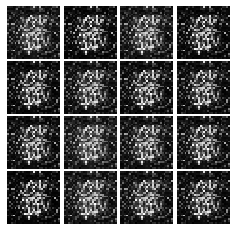

Epoch: 0, Iter: 240, D: 0.1171, G:0.542


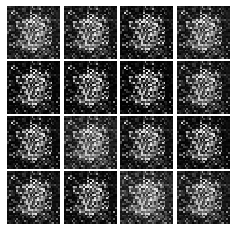

Epoch: 0, Iter: 260, D: 0.3282, G:0.06684


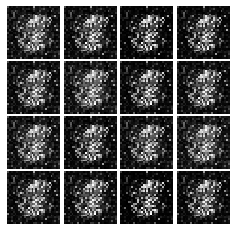

Epoch: 0, Iter: 280, D: 0.1161, G:0.4528


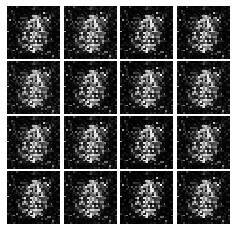

Epoch: 0, Iter: 300, D: 0.1286, G:0.3193


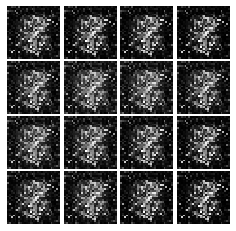

Epoch: 0, Iter: 320, D: 0.09481, G:0.3571


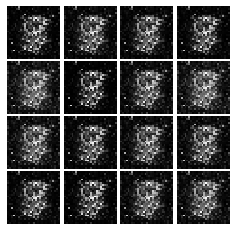

Epoch: 0, Iter: 340, D: 0.1124, G:0.3838


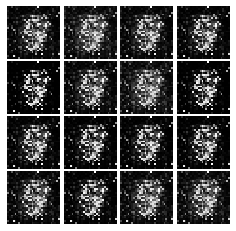

Epoch: 0, Iter: 360, D: 0.2354, G:0.1459


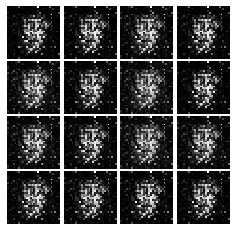

Epoch: 0, Iter: 380, D: 0.1627, G:0.5915


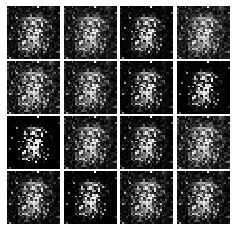

Epoch: 0, Iter: 400, D: 0.252, G:0.2013


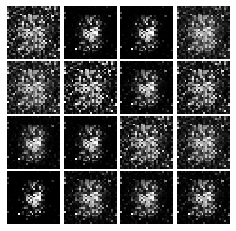

Epoch: 0, Iter: 420, D: 0.1434, G:0.4032


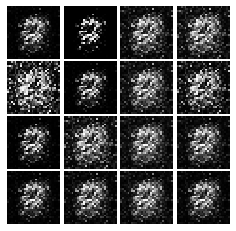

Epoch: 0, Iter: 440, D: 0.1283, G:0.4372


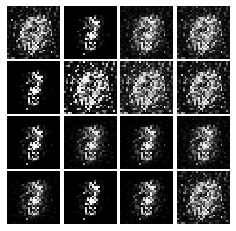

Epoch: 0, Iter: 460, D: 0.09548, G:0.5296


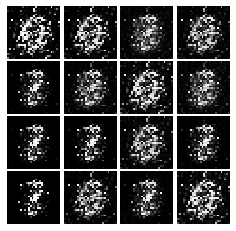

Epoch: 1, Iter: 480, D: 0.117, G:0.6005


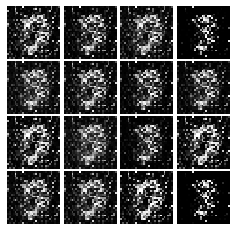

Epoch: 1, Iter: 500, D: 0.1918, G:0.1852


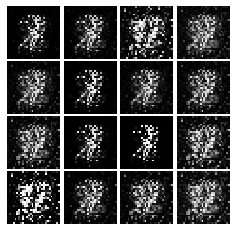

Epoch: 1, Iter: 520, D: 0.1273, G:0.5892


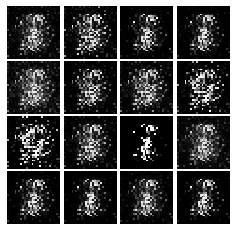

Epoch: 1, Iter: 540, D: 0.1243, G:0.2767


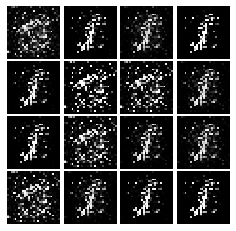

Epoch: 1, Iter: 560, D: 0.115, G:0.3323


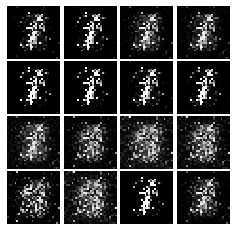

Epoch: 1, Iter: 580, D: 0.1113, G:0.5614


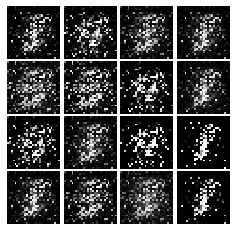

Epoch: 1, Iter: 600, D: 0.144, G:0.3909


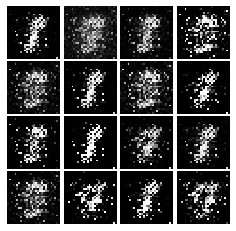

Epoch: 1, Iter: 620, D: 0.1052, G:0.3766


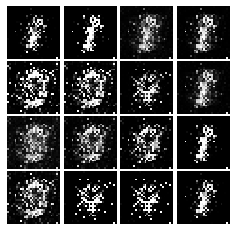

Epoch: 1, Iter: 640, D: 0.1028, G:0.4395


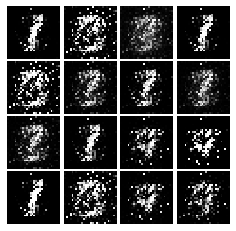

Epoch: 1, Iter: 660, D: 0.1364, G:0.415


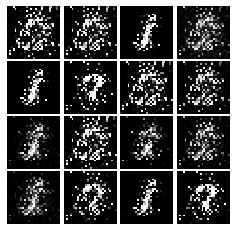

Epoch: 1, Iter: 680, D: 0.1076, G:0.3761


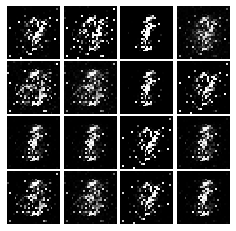

Epoch: 1, Iter: 700, D: 0.1083, G:0.3436


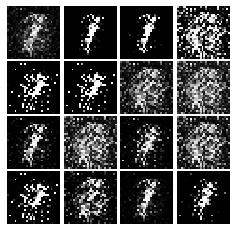

Epoch: 1, Iter: 720, D: 0.1378, G:0.2519


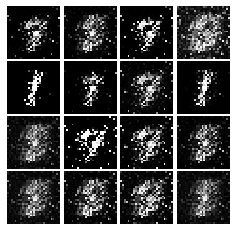

Epoch: 1, Iter: 740, D: 0.09578, G:0.3837


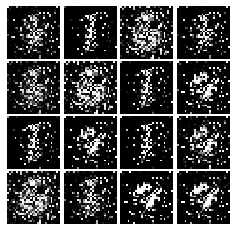

Epoch: 1, Iter: 760, D: 0.06334, G:0.6857


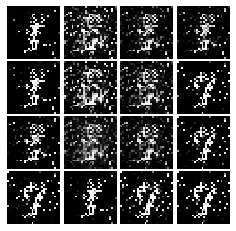

Epoch: 1, Iter: 780, D: 0.155, G:0.4368


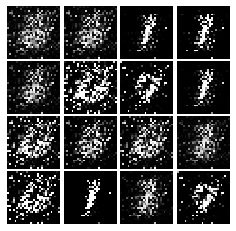

Epoch: 1, Iter: 800, D: 0.3475, G:0.4905


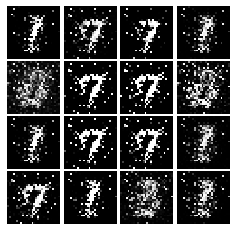

Epoch: 1, Iter: 820, D: 0.114, G:0.4316


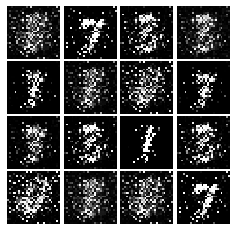

Epoch: 1, Iter: 840, D: 0.1271, G:0.3951


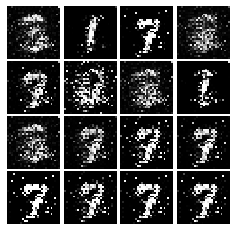

Epoch: 1, Iter: 860, D: 0.1832, G:0.2788


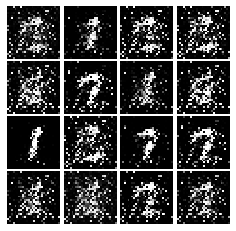

Epoch: 1, Iter: 880, D: 0.1691, G:0.6089


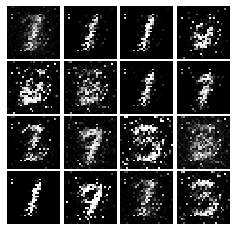

Epoch: 1, Iter: 900, D: 0.1225, G:0.3849


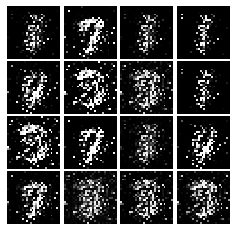

Epoch: 1, Iter: 920, D: 0.1036, G:0.5335


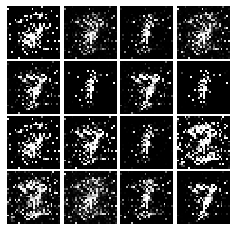

Epoch: 2, Iter: 940, D: 0.08733, G:0.3813


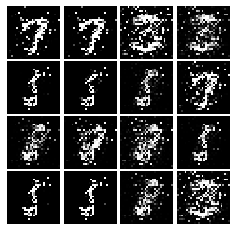

Epoch: 2, Iter: 960, D: 0.6197, G:0.04065


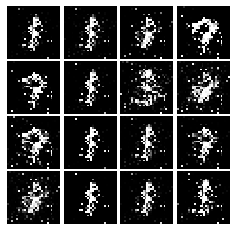

Epoch: 2, Iter: 980, D: 0.1039, G:0.3993


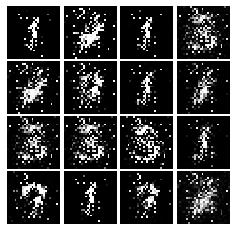

Epoch: 2, Iter: 1000, D: 0.1334, G:0.7676


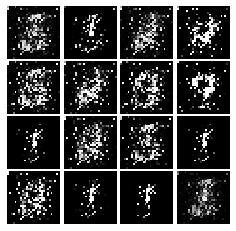

Epoch: 2, Iter: 1020, D: 0.1205, G:0.346


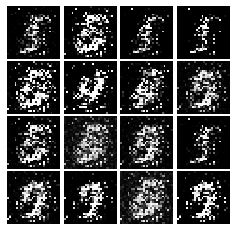

Epoch: 2, Iter: 1040, D: 0.1068, G:0.2405


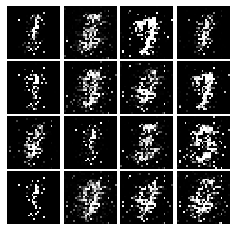

Epoch: 2, Iter: 1060, D: 0.1021, G:0.6529


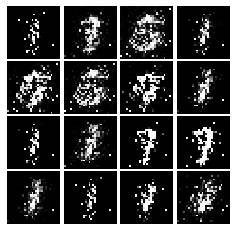

Epoch: 2, Iter: 1080, D: 0.1203, G:0.2806


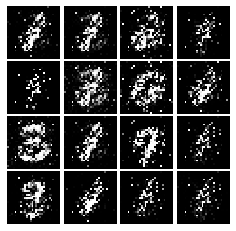

Epoch: 2, Iter: 1100, D: 0.8367, G:0.01738


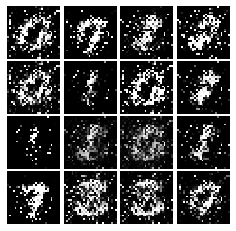

Epoch: 2, Iter: 1120, D: 0.2914, G:0.2074


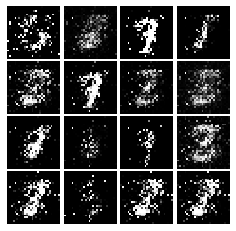

Epoch: 2, Iter: 1140, D: 0.2001, G:0.4641


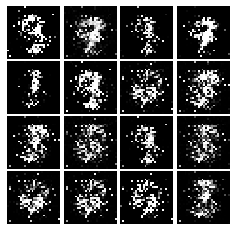

Epoch: 2, Iter: 1160, D: 0.1088, G:0.02182


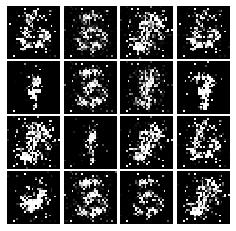

Epoch: 2, Iter: 1180, D: 0.169, G:0.2972


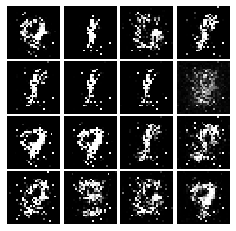

Epoch: 2, Iter: 1200, D: 0.1697, G:0.3766


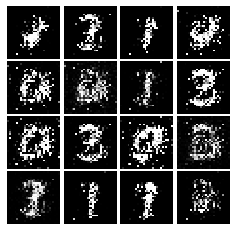

Epoch: 2, Iter: 1220, D: 0.1617, G:0.3653


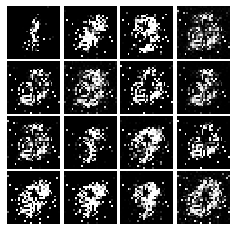

Epoch: 2, Iter: 1240, D: 0.1461, G:0.306


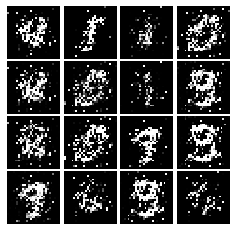

Epoch: 2, Iter: 1260, D: 0.1467, G:0.3281


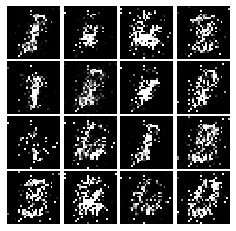

Epoch: 2, Iter: 1280, D: 0.1587, G:0.2776


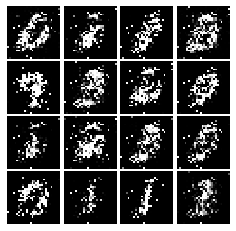

Epoch: 2, Iter: 1300, D: 0.1253, G:0.432


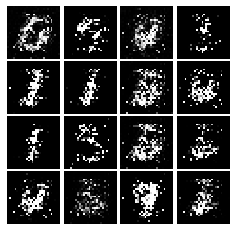

Epoch: 2, Iter: 1320, D: 0.1796, G:0.3555


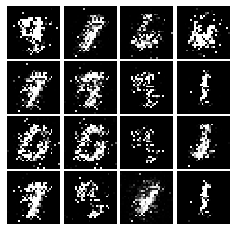

Epoch: 2, Iter: 1340, D: 0.1484, G:0.2815


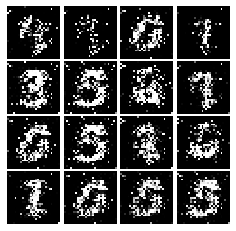

Epoch: 2, Iter: 1360, D: 0.1976, G:0.2297


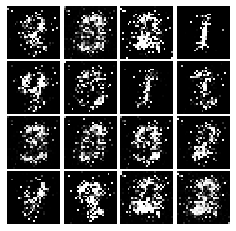

Epoch: 2, Iter: 1380, D: 0.2524, G:0.4892


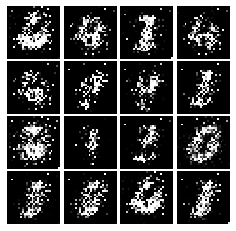

Epoch: 2, Iter: 1400, D: 0.1631, G:0.2265


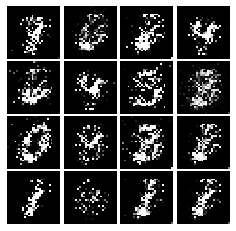

Epoch: 3, Iter: 1420, D: 0.1842, G:0.3752


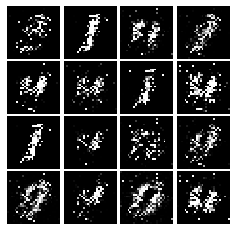

Epoch: 3, Iter: 1440, D: 0.1741, G:0.1784


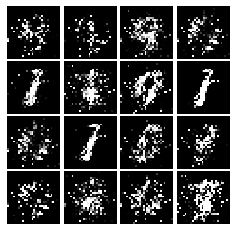

Epoch: 3, Iter: 1460, D: 0.1471, G:0.2689


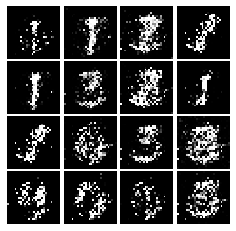

Epoch: 3, Iter: 1480, D: 0.1754, G:0.2872


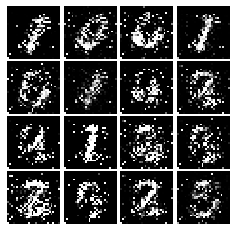

Epoch: 3, Iter: 1500, D: 0.1536, G:0.3102


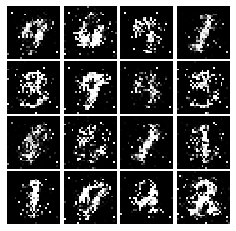

Epoch: 3, Iter: 1520, D: 0.1866, G:0.3472


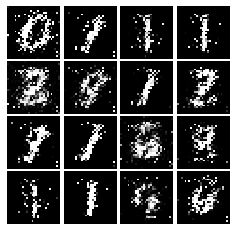

Epoch: 3, Iter: 1540, D: 0.1769, G:0.2534


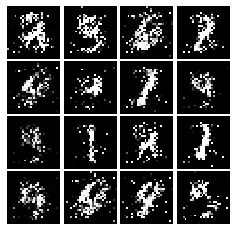

Epoch: 3, Iter: 1560, D: 0.1463, G:0.5622


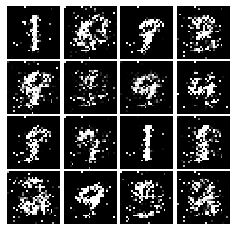

Epoch: 3, Iter: 1580, D: 0.1409, G:0.2991


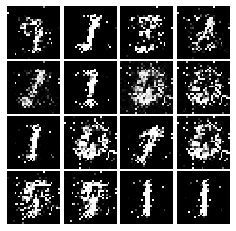

Epoch: 3, Iter: 1600, D: 0.1565, G:0.2627


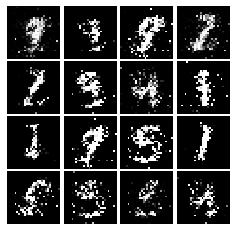

Epoch: 3, Iter: 1620, D: 0.1696, G:0.2197


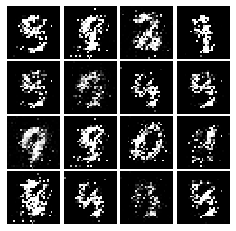

Epoch: 3, Iter: 1640, D: 0.2048, G:0.2043


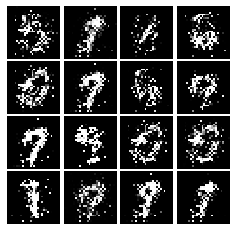

Epoch: 3, Iter: 1660, D: 0.1351, G:0.4424


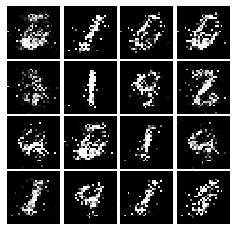

Epoch: 3, Iter: 1680, D: 0.165, G:0.3439


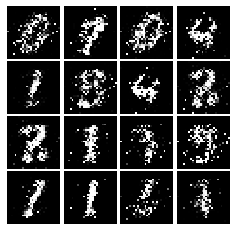

Epoch: 3, Iter: 1700, D: 0.1858, G:0.14


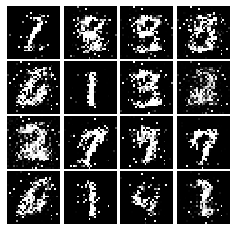

Epoch: 3, Iter: 1720, D: 0.192, G:0.3383


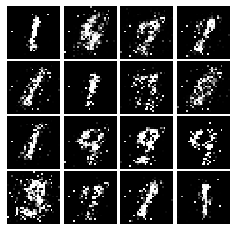

Epoch: 3, Iter: 1740, D: 0.1594, G:0.2504


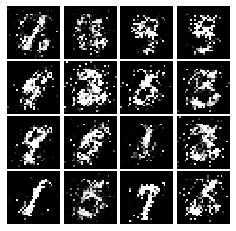

Epoch: 3, Iter: 1760, D: 0.1577, G:0.2698


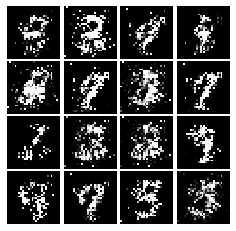

Epoch: 3, Iter: 1780, D: 0.2125, G:0.2258


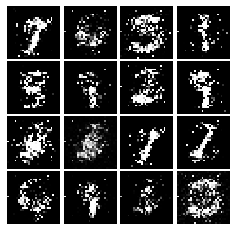

Epoch: 3, Iter: 1800, D: 0.1983, G:0.2219


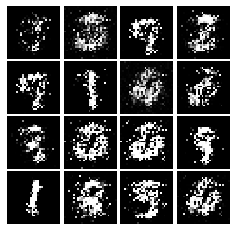

Epoch: 3, Iter: 1820, D: 0.1696, G:0.08795


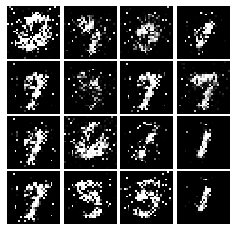

Epoch: 3, Iter: 1840, D: 0.2178, G:0.2775


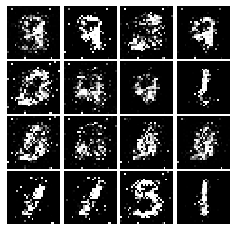

Epoch: 3, Iter: 1860, D: 0.1799, G:0.2766


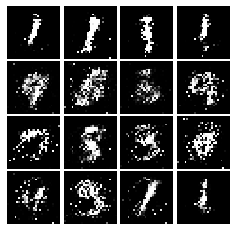

Epoch: 4, Iter: 1880, D: 0.1765, G:0.1976


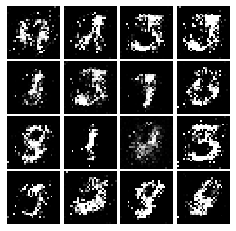

Epoch: 4, Iter: 1900, D: 0.2098, G:0.2366


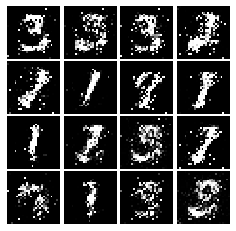

Epoch: 4, Iter: 1920, D: 0.1989, G:0.1916


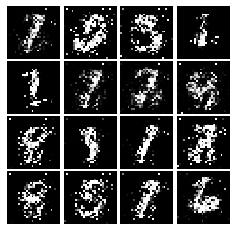

Epoch: 4, Iter: 1940, D: 0.1906, G:0.2303


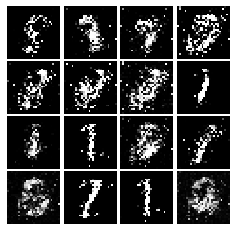

Epoch: 4, Iter: 1960, D: 0.1713, G:0.2124


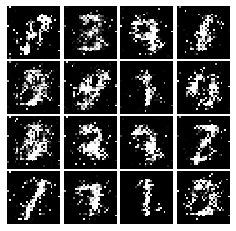

Epoch: 4, Iter: 1980, D: 0.2112, G:0.1906


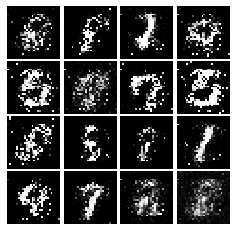

Epoch: 4, Iter: 2000, D: 0.2001, G:0.233


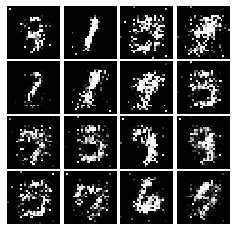

Epoch: 4, Iter: 2020, D: 0.2096, G:0.1659


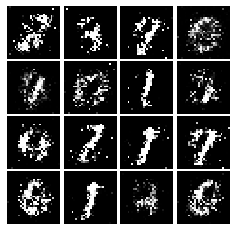

Epoch: 4, Iter: 2040, D: 0.2069, G:0.2182


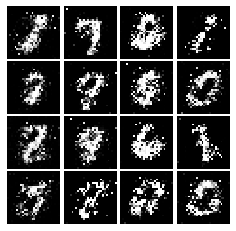

Epoch: 4, Iter: 2060, D: 0.2054, G:0.198


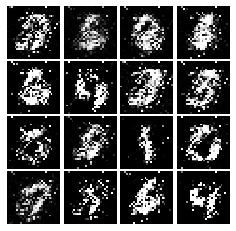

Epoch: 4, Iter: 2080, D: 0.216, G:0.2056


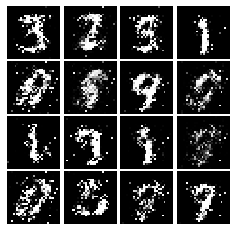

Epoch: 4, Iter: 2100, D: 0.2114, G:0.2063


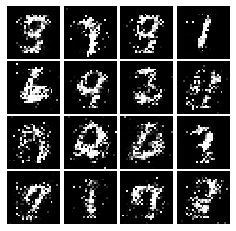

Epoch: 4, Iter: 2120, D: 0.1772, G:0.2344


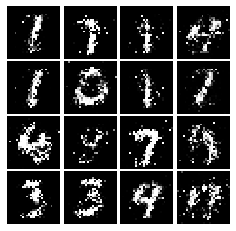

Epoch: 4, Iter: 2140, D: 0.2475, G:0.1864


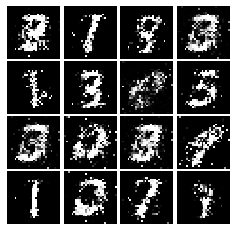

Epoch: 4, Iter: 2160, D: 0.2362, G:0.201


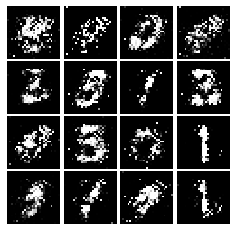

Epoch: 4, Iter: 2180, D: 0.2304, G:0.2169


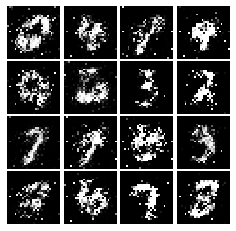

Epoch: 4, Iter: 2200, D: 0.2253, G:0.1929


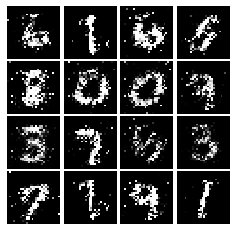

Epoch: 4, Iter: 2220, D: 0.228, G:0.1485


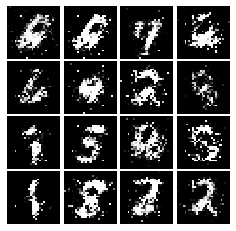

Epoch: 4, Iter: 2240, D: 0.2164, G:0.2075


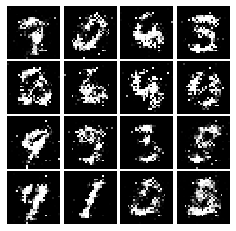

Epoch: 4, Iter: 2260, D: 0.2036, G:0.2005


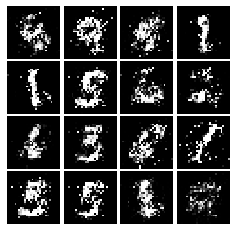

Epoch: 4, Iter: 2280, D: 0.2152, G:0.211


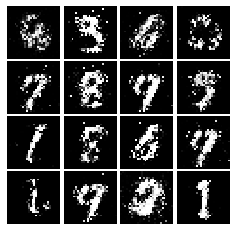

Epoch: 4, Iter: 2300, D: 0.2196, G:0.1583


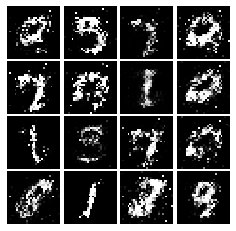

Epoch: 4, Iter: 2320, D: 0.2201, G:0.1941


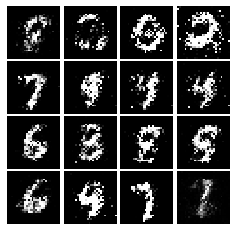

Epoch: 4, Iter: 2340, D: 0.178, G:0.2498


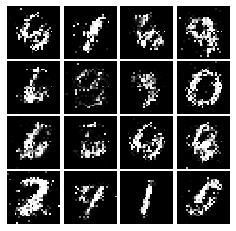

Epoch: 5, Iter: 2360, D: 0.1996, G:0.2121


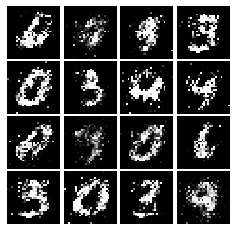

Epoch: 5, Iter: 2380, D: 0.2124, G:0.1758


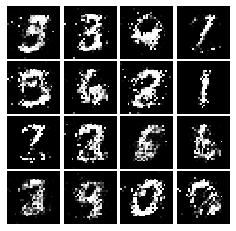

Epoch: 5, Iter: 2400, D: 0.2028, G:0.2024


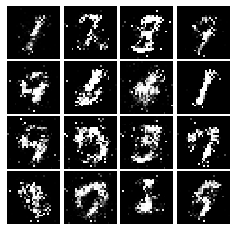

Epoch: 5, Iter: 2420, D: 0.2042, G:0.1763


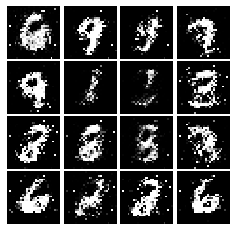

Epoch: 5, Iter: 2440, D: 0.215, G:0.1805


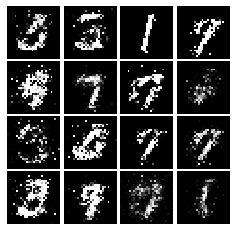

Epoch: 5, Iter: 2460, D: 0.21, G:0.2136


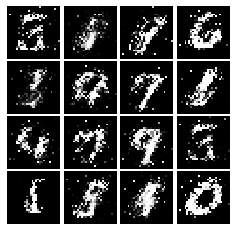

Epoch: 5, Iter: 2480, D: 0.2184, G:0.1676


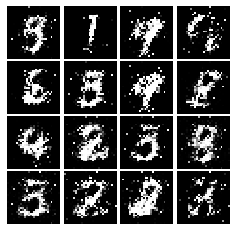

Epoch: 5, Iter: 2500, D: 0.1903, G:0.1987


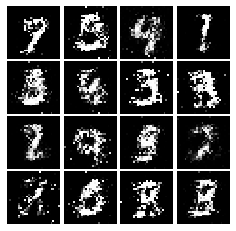

Epoch: 5, Iter: 2520, D: 0.2585, G:0.1615


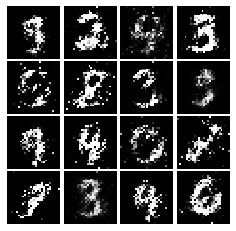

Epoch: 5, Iter: 2540, D: 0.2334, G:0.2108


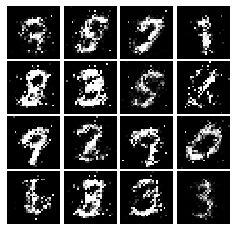

Epoch: 5, Iter: 2560, D: 0.2389, G:0.1631


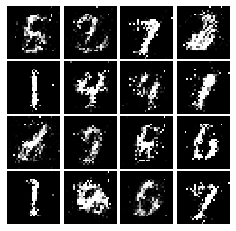

Epoch: 5, Iter: 2580, D: 0.2305, G:0.1966


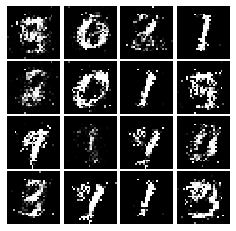

Epoch: 5, Iter: 2600, D: 0.2427, G:0.1631


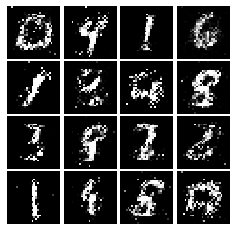

Epoch: 5, Iter: 2620, D: 0.2292, G:0.1591


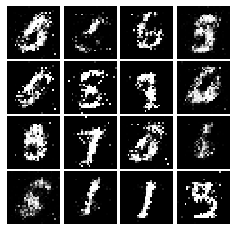

Epoch: 5, Iter: 2640, D: 0.2351, G:0.1764


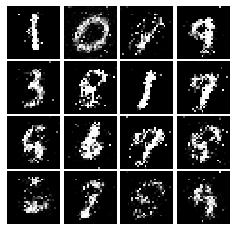

Epoch: 5, Iter: 2660, D: 0.224, G:0.1745


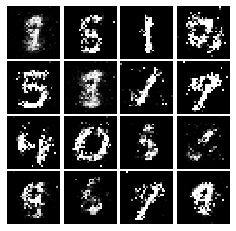

Epoch: 5, Iter: 2680, D: 0.2363, G:0.1704


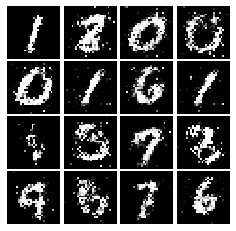

Epoch: 5, Iter: 2700, D: 0.2145, G:0.1744


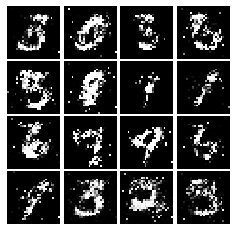

Epoch: 5, Iter: 2720, D: 0.2203, G:0.1609


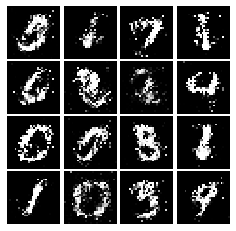

Epoch: 5, Iter: 2740, D: 0.2523, G:0.1627


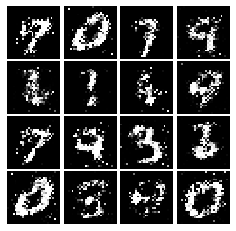

Epoch: 5, Iter: 2760, D: 0.2295, G:0.1606


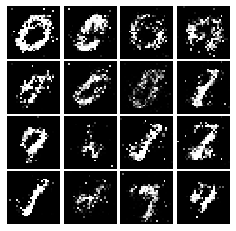

Epoch: 5, Iter: 2780, D: 0.2199, G:0.1643


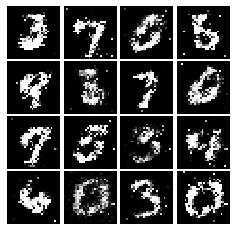

Epoch: 5, Iter: 2800, D: 0.215, G:0.2008


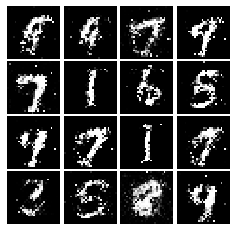

Epoch: 6, Iter: 2820, D: 0.2323, G:0.1625


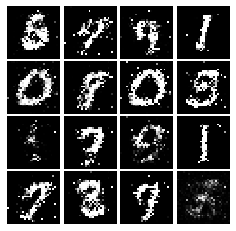

Epoch: 6, Iter: 2840, D: 0.2354, G:0.1596


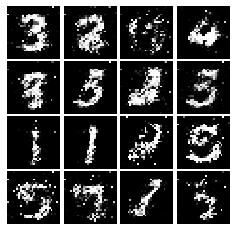

Epoch: 6, Iter: 2860, D: 0.2251, G:0.1821


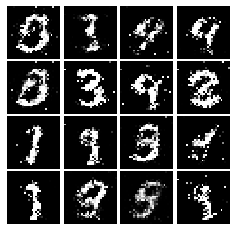

Epoch: 6, Iter: 2880, D: 0.2206, G:0.2333


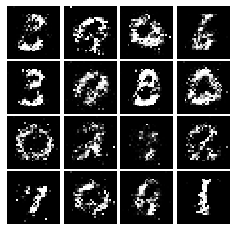

Epoch: 6, Iter: 2900, D: 0.2219, G:0.1836


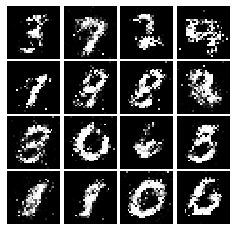

Epoch: 6, Iter: 2920, D: 0.2181, G:0.1672


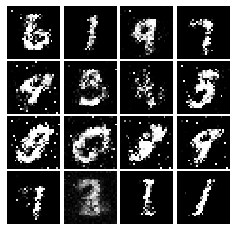

Epoch: 6, Iter: 2940, D: 0.2319, G:0.1482


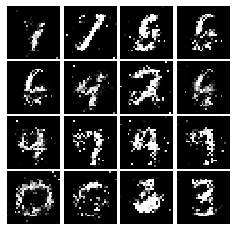

Epoch: 6, Iter: 2960, D: 0.2352, G:0.1812


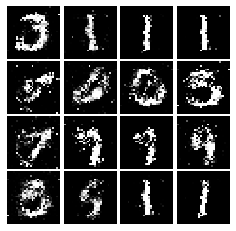

Epoch: 6, Iter: 2980, D: 0.253, G:0.1722


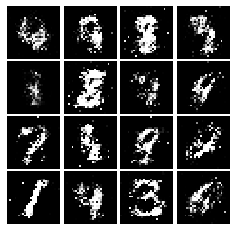

Epoch: 6, Iter: 3000, D: 0.2252, G:0.1736


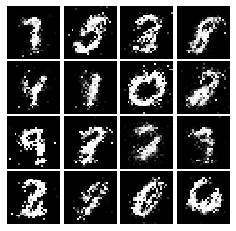

Epoch: 6, Iter: 3020, D: 0.253, G:0.185


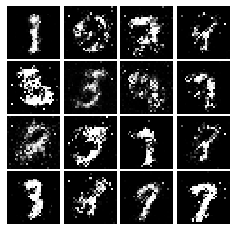

Epoch: 6, Iter: 3040, D: 0.223, G:0.1932


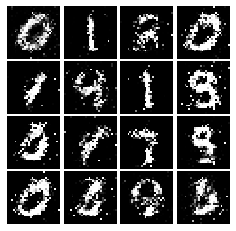

Epoch: 6, Iter: 3060, D: 0.221, G:0.1688


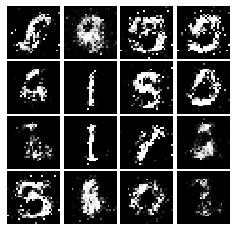

Epoch: 6, Iter: 3080, D: 0.2549, G:0.1227


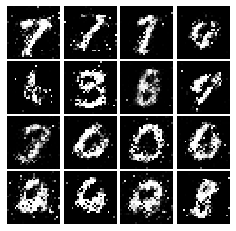

Epoch: 6, Iter: 3100, D: 0.2204, G:0.1962


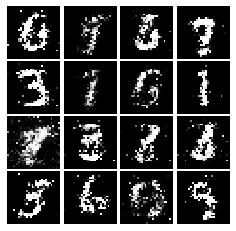

Epoch: 6, Iter: 3120, D: 0.2254, G:0.1746


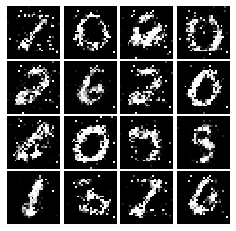

Epoch: 6, Iter: 3140, D: 0.2214, G:0.1553


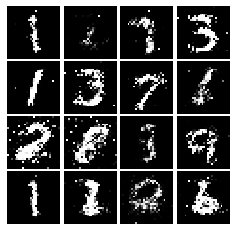

Epoch: 6, Iter: 3160, D: 0.2334, G:0.1776


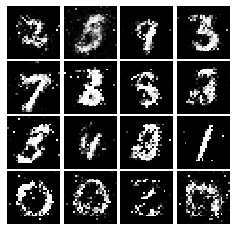

Epoch: 6, Iter: 3180, D: 0.2066, G:0.2918


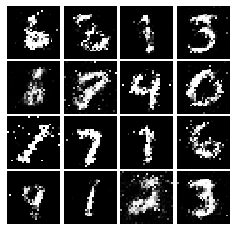

Epoch: 6, Iter: 3200, D: 0.2219, G:0.1874


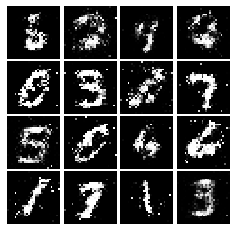

Epoch: 6, Iter: 3220, D: 0.2362, G:0.1734


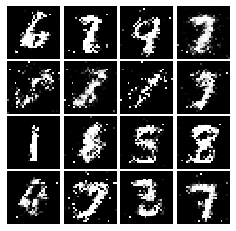

Epoch: 6, Iter: 3240, D: 0.2182, G:0.1587


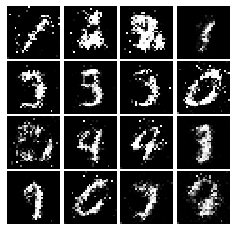

Epoch: 6, Iter: 3260, D: 0.2333, G:0.1894


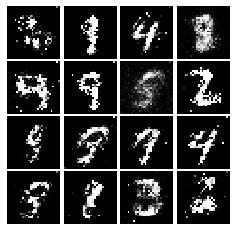

Epoch: 6, Iter: 3280, D: 0.2323, G:0.1774


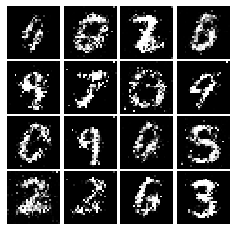

Epoch: 7, Iter: 3300, D: 0.2082, G:0.1824


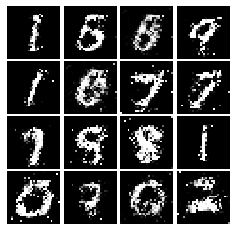

Epoch: 7, Iter: 3320, D: 0.2113, G:0.1889


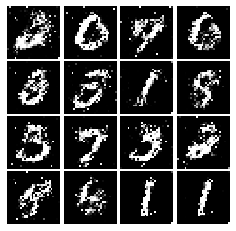

Epoch: 7, Iter: 3340, D: 0.2353, G:0.171


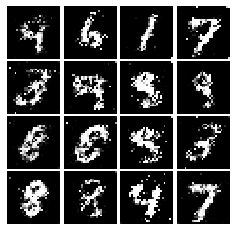

Epoch: 7, Iter: 3360, D: 0.2476, G:0.1837


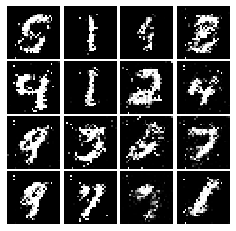

Epoch: 7, Iter: 3380, D: 0.2227, G:0.153


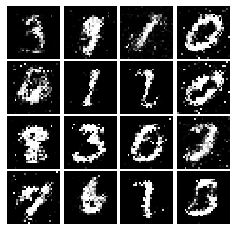

Epoch: 7, Iter: 3400, D: 0.2209, G:0.1597


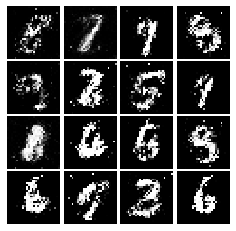

Epoch: 7, Iter: 3420, D: 0.2254, G:0.181


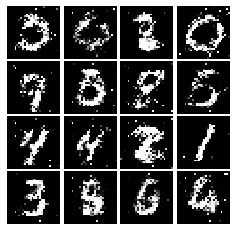

Epoch: 7, Iter: 3440, D: 0.218, G:0.1796


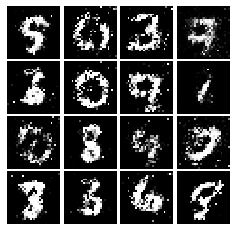

Epoch: 7, Iter: 3460, D: 0.2161, G:0.1904


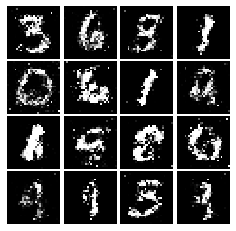

Epoch: 7, Iter: 3480, D: 0.2174, G:0.195


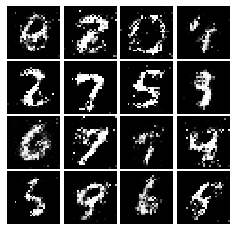

Epoch: 7, Iter: 3500, D: 0.2155, G:0.174


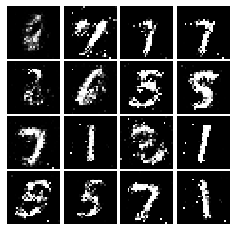

Epoch: 7, Iter: 3520, D: 0.24, G:0.1702


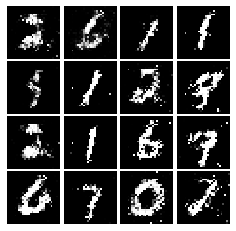

Epoch: 7, Iter: 3540, D: 0.1973, G:0.217


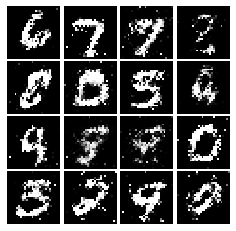

Epoch: 7, Iter: 3560, D: 0.2188, G:0.1641


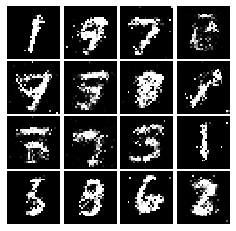

Epoch: 7, Iter: 3580, D: 0.2305, G:0.1655


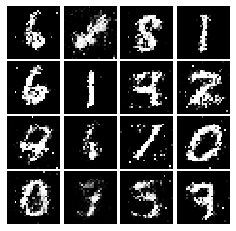

Epoch: 7, Iter: 3600, D: 0.2365, G:0.1682


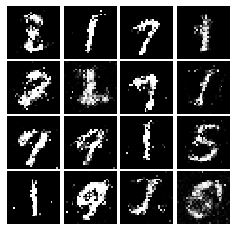

Epoch: 7, Iter: 3620, D: 0.2183, G:0.1822


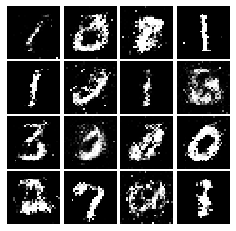

Epoch: 7, Iter: 3640, D: 0.2428, G:0.1749


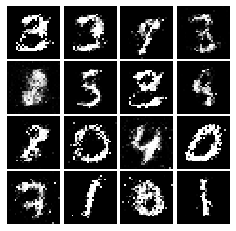

Epoch: 7, Iter: 3660, D: 0.23, G:0.1807


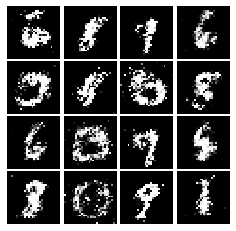

Epoch: 7, Iter: 3680, D: 0.2219, G:0.2031


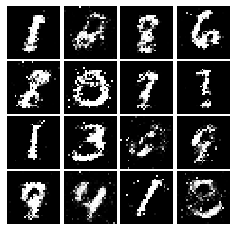

Epoch: 7, Iter: 3700, D: 0.2241, G:0.1687


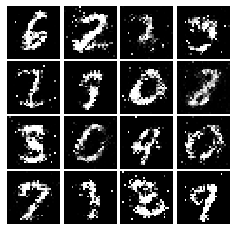

Epoch: 7, Iter: 3720, D: 0.2187, G:0.152


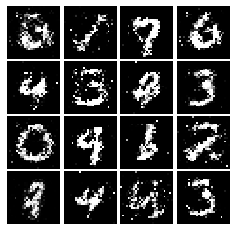

Epoch: 7, Iter: 3740, D: 0.2311, G:0.1478


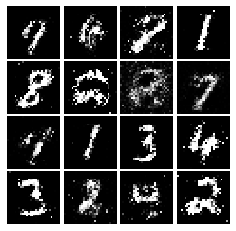

Epoch: 8, Iter: 3760, D: 0.2371, G:0.1655


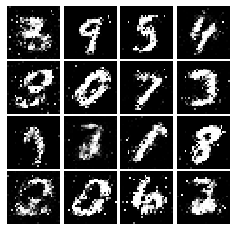

Epoch: 8, Iter: 3780, D: 0.2414, G:0.1446


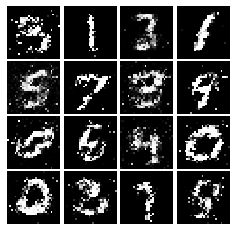

Epoch: 8, Iter: 3800, D: 0.2096, G:0.1696


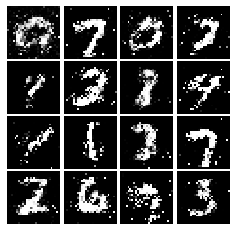

Epoch: 8, Iter: 3820, D: 0.229, G:0.1742


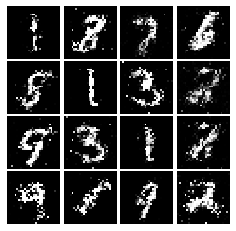

Epoch: 8, Iter: 3840, D: 0.2329, G:0.1596


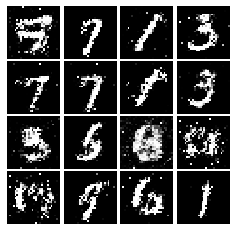

Epoch: 8, Iter: 3860, D: 0.2205, G:0.1759


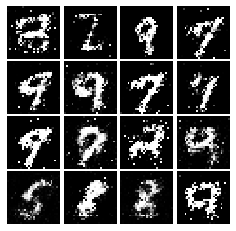

Epoch: 8, Iter: 3880, D: 0.2184, G:0.1848


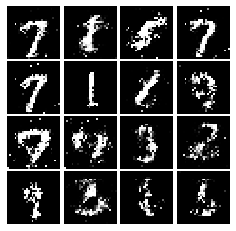

Epoch: 8, Iter: 3900, D: 0.2495, G:0.1531


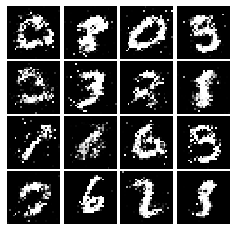

Epoch: 8, Iter: 3920, D: 0.2245, G:0.1637


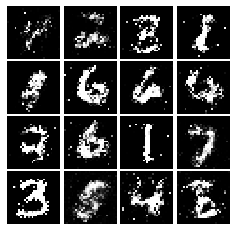

Epoch: 8, Iter: 3940, D: 0.2525, G:0.1566


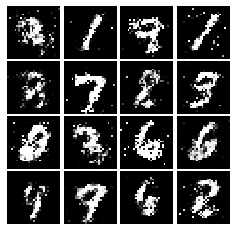

Epoch: 8, Iter: 3960, D: 0.233, G:0.1568


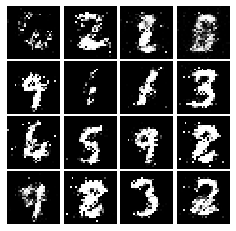

Epoch: 8, Iter: 3980, D: 0.2295, G:0.173


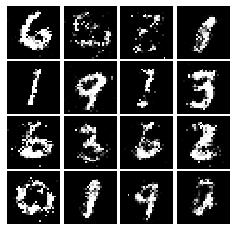

Epoch: 8, Iter: 4000, D: 0.2087, G:0.1661


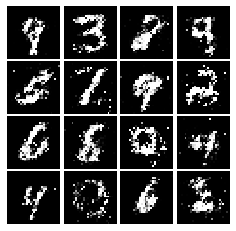

Epoch: 8, Iter: 4020, D: 0.2347, G:0.1661


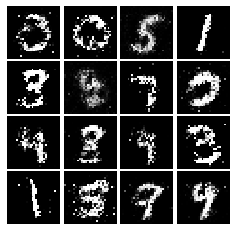

Epoch: 8, Iter: 4040, D: 0.2283, G:0.1814


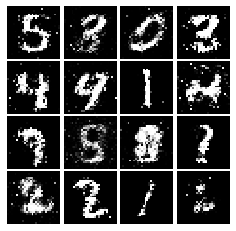

Epoch: 8, Iter: 4060, D: 0.2253, G:0.161


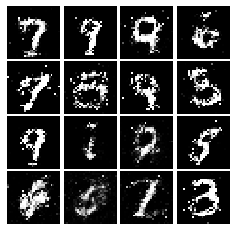

Epoch: 8, Iter: 4080, D: 0.241, G:0.1517


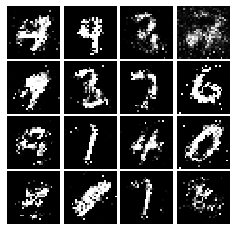

Epoch: 8, Iter: 4100, D: 0.2195, G:0.1359


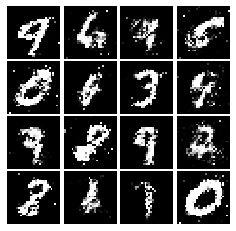

Epoch: 8, Iter: 4120, D: 0.2382, G:0.1698


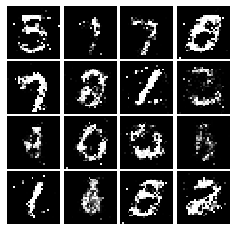

Epoch: 8, Iter: 4140, D: 0.2349, G:0.1928


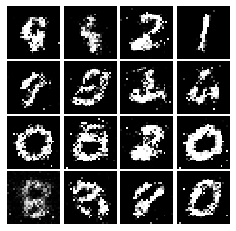

Epoch: 8, Iter: 4160, D: 0.2491, G:0.1574


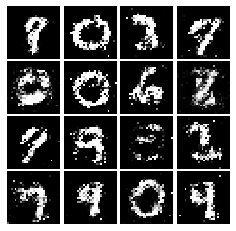

Epoch: 8, Iter: 4180, D: 0.2614, G:0.1483


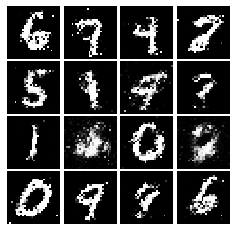

Epoch: 8, Iter: 4200, D: 0.2148, G:0.1471


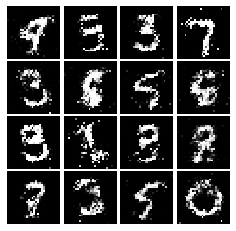

Epoch: 8, Iter: 4220, D: 0.2086, G:0.1544


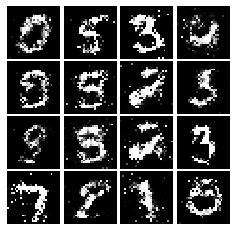

Epoch: 9, Iter: 4240, D: 0.2267, G:0.1708


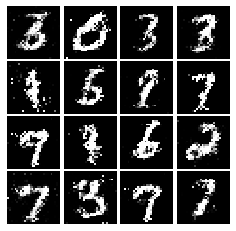

Epoch: 9, Iter: 4260, D: 0.2383, G:0.1611


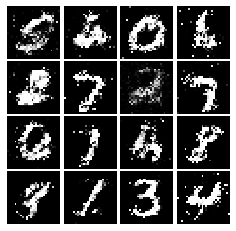

Epoch: 9, Iter: 4280, D: 0.3027, G:0.1835


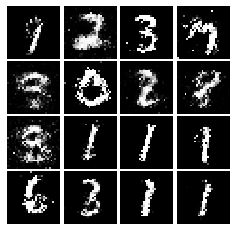

Epoch: 9, Iter: 4300, D: 0.2413, G:0.1727


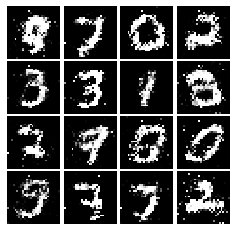

Epoch: 9, Iter: 4320, D: 0.2326, G:0.1706


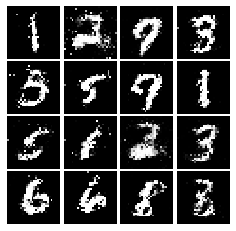

Epoch: 9, Iter: 4340, D: 0.243, G:0.1746


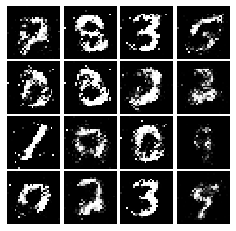

Epoch: 9, Iter: 4360, D: 0.2361, G:0.1707


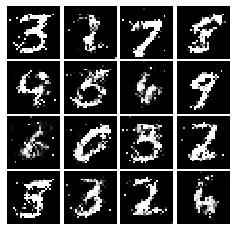

Epoch: 9, Iter: 4380, D: 0.2588, G:0.1629


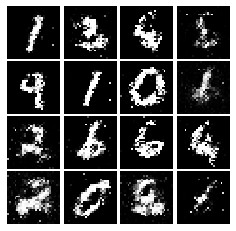

Epoch: 9, Iter: 4400, D: 0.2091, G:0.1974


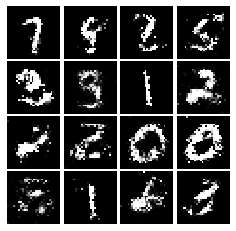

Epoch: 9, Iter: 4420, D: 0.2135, G:0.16


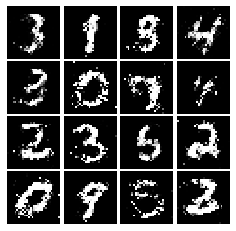

Epoch: 9, Iter: 4440, D: 0.2489, G:0.1498


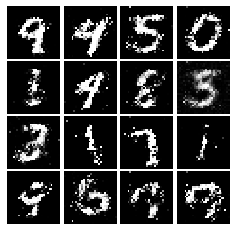

Epoch: 9, Iter: 4460, D: 0.2384, G:0.1318


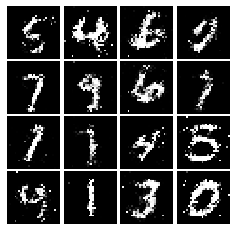

Epoch: 9, Iter: 4480, D: 0.2151, G:0.1779


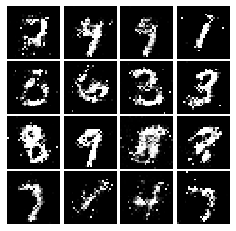

Epoch: 9, Iter: 4500, D: 0.2554, G:0.1598


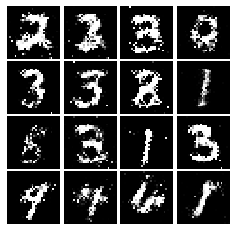

Epoch: 9, Iter: 4520, D: 0.2321, G:0.1498


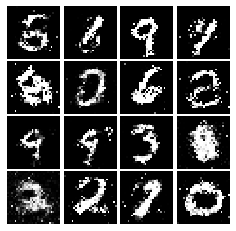

Epoch: 9, Iter: 4540, D: 0.239, G:0.1464


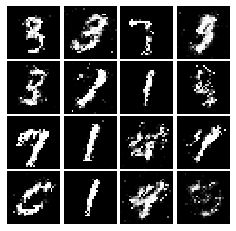

Epoch: 9, Iter: 4560, D: 0.255, G:0.1534


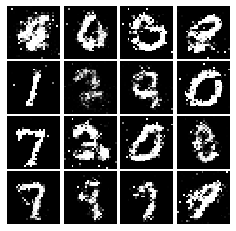

Epoch: 9, Iter: 4580, D: 0.217, G:0.1916


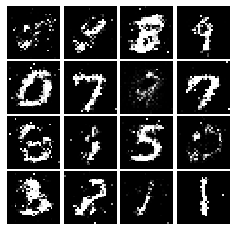

Epoch: 9, Iter: 4600, D: 0.2347, G:0.1679


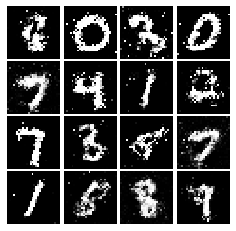

Epoch: 9, Iter: 4620, D: 0.2516, G:0.1728


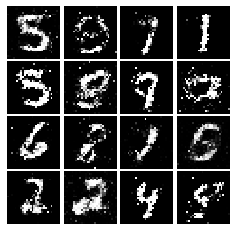

Epoch: 9, Iter: 4640, D: 0.226, G:0.1775


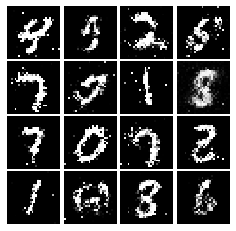

Epoch: 9, Iter: 4660, D: 0.2235, G:0.159


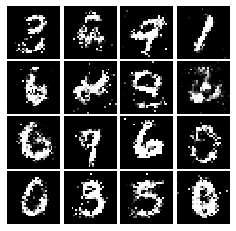

Epoch: 9, Iter: 4680, D: 0.2283, G:0.1942


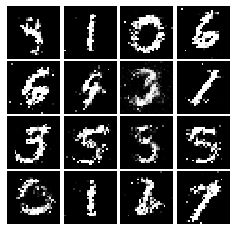

Final images


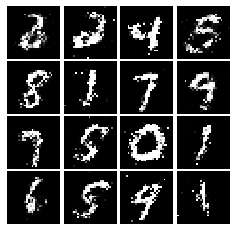

In [32]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [166]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        layers.Reshape([28, 28, 1], input_shape =(784,)),
        layers.Conv2D(kernel_size = (5,5), filters = 32, activation = layers.LeakyReLU(alpha=0.01), strides = 1, padding = 'VALID'),
        layers.MaxPooling2D(pool_size = (2,2), strides = 2),
        layers.Conv2D(kernel_size = (5,5), filters = 64, activation = layers.LeakyReLU(alpha=0.01), strides = 1, padding = 'VALID'),
        layers.MaxPooling2D(pool_size = (2,2), strides = 2),
        layers.Flatten(),    
        layers.Dense(1024, use_bias=True,  activation = layers.LeakyReLU(alpha=0.01)),    
        layers.Dense(1, use_bias=True, activation='linear')
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [203]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    BL1, BL2, BL3 = layers.BatchNormalization(), layers.BatchNormalization(), layers.BatchNormalization()
    BL1.training, BL2.training, BL3.training = True, True, True

    model.add(layers.Dense(1024, use_bias=True,  activation = 'relu', input_shape =(noise_dim,) ))
    model.add(BL1), 
    model.add(layers.Dense(6272, use_bias=True,  activation = 'relu' )),
    model.add(BL2),
    model.add(layers.Reshape((7,7,128))),
    model.add(layers.Conv2DTranspose(kernel_size = (4,4), filters = 64, activation = 'relu', padding = 'same', strides = 2, use_bias=True)),
    model.add(BL3),
    model.add(layers.Conv2DTranspose(kernel_size = (4,4), filters = 1, activation = 'tanh', padding = 'same',strides = 2, use_bias=True)),

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.329, G:0.6547


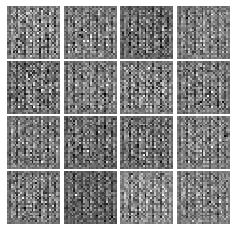

Epoch: 0, Iter: 20, D: 0.5649, G:1.409


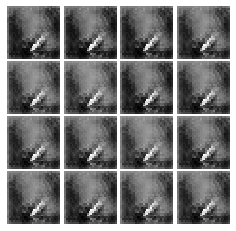

Epoch: 0, Iter: 40, D: 0.4106, G:1.769


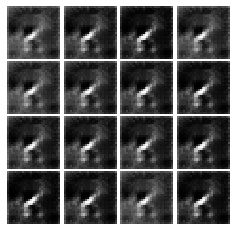

Epoch: 0, Iter: 60, D: 2.541, G:0.7376


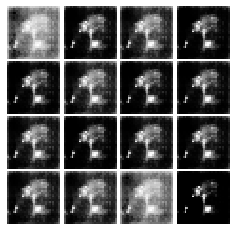

Epoch: 0, Iter: 80, D: 0.6603, G:2.201


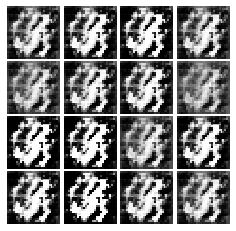

Epoch: 0, Iter: 100, D: 4.357, G:2.643


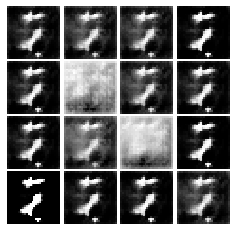

Epoch: 0, Iter: 120, D: 0.621, G:2.917


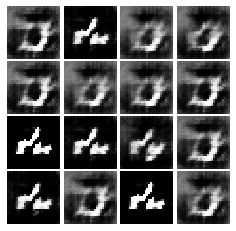

Epoch: 0, Iter: 140, D: 0.7699, G:2.821


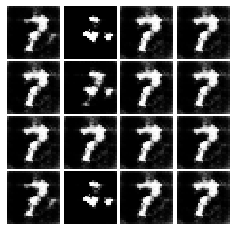

Epoch: 0, Iter: 160, D: 0.2506, G:3.822


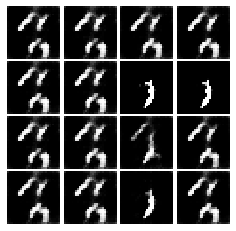

Epoch: 0, Iter: 180, D: 0.4978, G:1.905


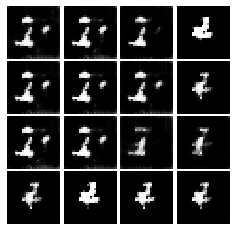

Epoch: 0, Iter: 200, D: 0.7392, G:1.323


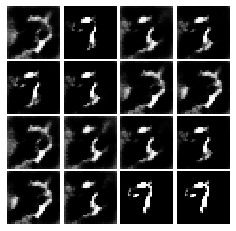

Epoch: 0, Iter: 220, D: 1.408, G:1.385


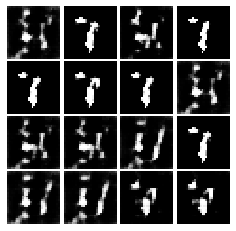

Epoch: 0, Iter: 240, D: 0.4945, G:2.501


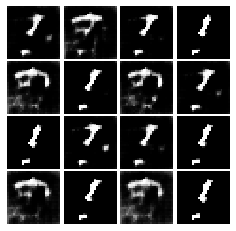

Epoch: 0, Iter: 260, D: 0.8551, G:3.89


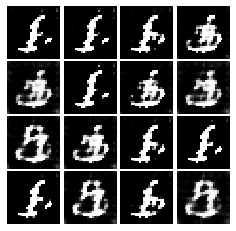

Epoch: 0, Iter: 280, D: 0.511, G:2.356


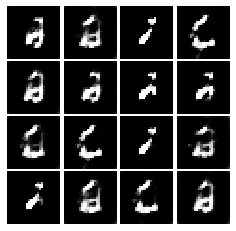

Epoch: 0, Iter: 300, D: 1.097, G:4.148


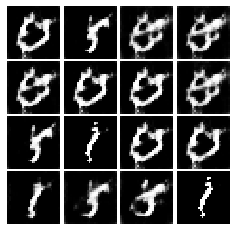

Epoch: 0, Iter: 320, D: 0.6229, G:2.287


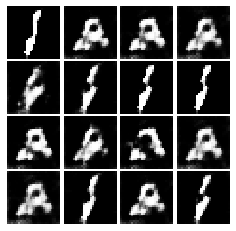

Epoch: 0, Iter: 340, D: 0.7133, G:2.617


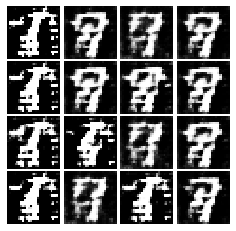

Epoch: 0, Iter: 360, D: 0.3983, G:2.87


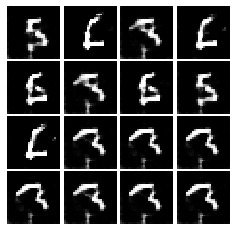

Epoch: 0, Iter: 380, D: 0.3967, G:3.032


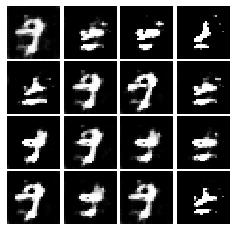

Epoch: 0, Iter: 400, D: 0.2499, G:2.975


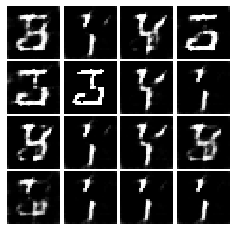

Epoch: 0, Iter: 420, D: 0.6983, G:2.186


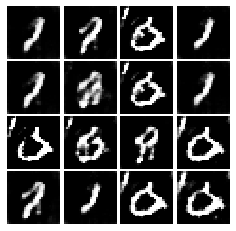

Epoch: 0, Iter: 440, D: 0.4231, G:3.066


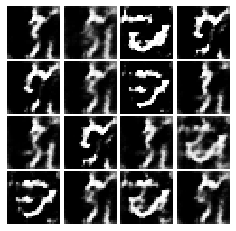

Epoch: 0, Iter: 460, D: 0.5257, G:2.4


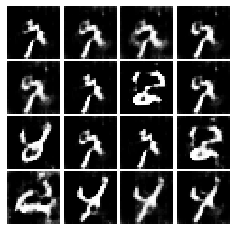

Epoch: 1, Iter: 480, D: 0.4609, G:2.849


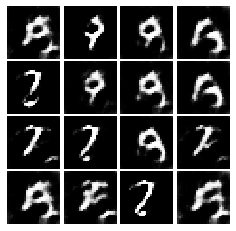

Epoch: 1, Iter: 500, D: 0.7839, G:1.675


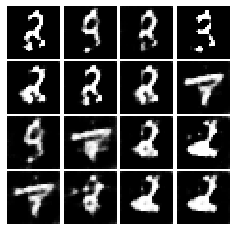

Epoch: 1, Iter: 520, D: 0.3742, G:3.392


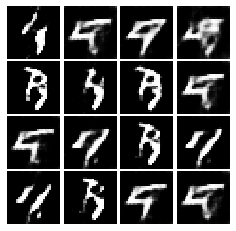

Epoch: 1, Iter: 540, D: 0.8141, G:1.581


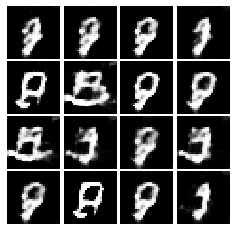

Epoch: 1, Iter: 560, D: 1.405, G:2.169


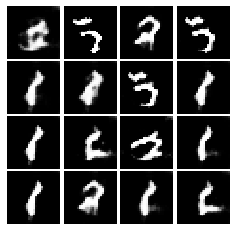

Epoch: 1, Iter: 580, D: 0.3297, G:3.348


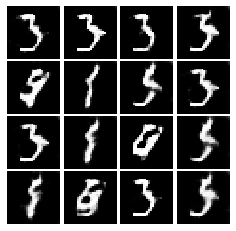

Epoch: 1, Iter: 600, D: 0.3971, G:2.893


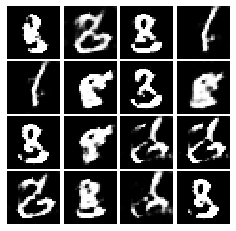

Epoch: 1, Iter: 620, D: 0.5771, G:4.779


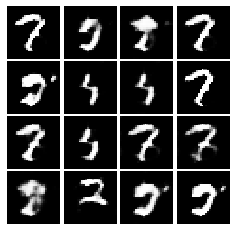

Epoch: 1, Iter: 640, D: 1.786, G:7.657


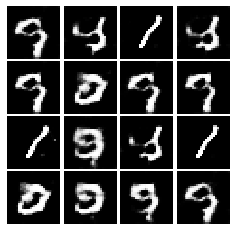

Epoch: 1, Iter: 660, D: 0.4305, G:3.146


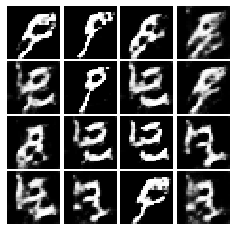

Epoch: 1, Iter: 680, D: 0.6384, G:2.346


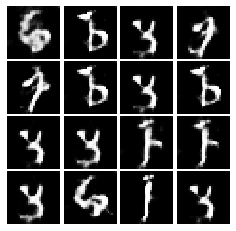

Epoch: 1, Iter: 700, D: 0.7231, G:3.331


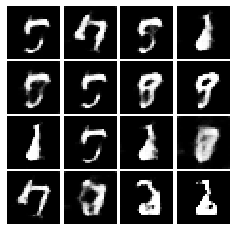

Epoch: 1, Iter: 720, D: 0.7547, G:3.138


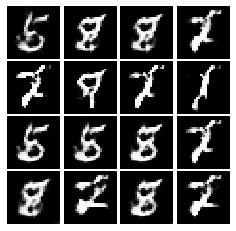

Epoch: 1, Iter: 740, D: 0.5418, G:2.813


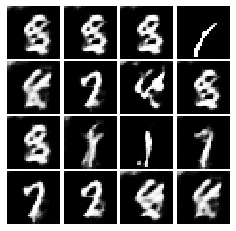

Epoch: 1, Iter: 760, D: 0.328, G:2.668


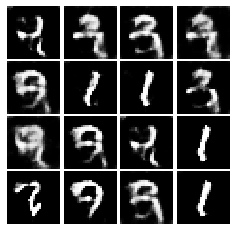

Epoch: 1, Iter: 780, D: 0.3858, G:2.705


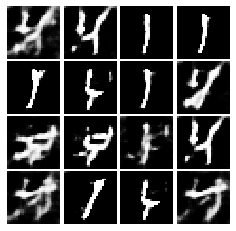

Epoch: 1, Iter: 800, D: 0.6181, G:5.051


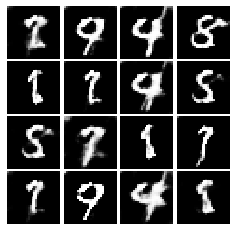

Epoch: 1, Iter: 820, D: 0.6115, G:3.052


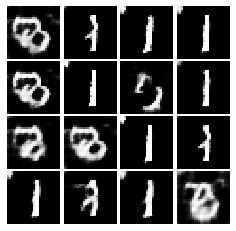

Epoch: 1, Iter: 840, D: 0.432, G:2.621


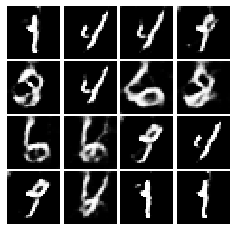

Epoch: 1, Iter: 860, D: 0.2993, G:3.476


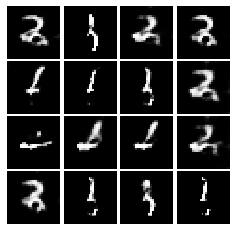

Epoch: 1, Iter: 880, D: 0.355, G:3.619


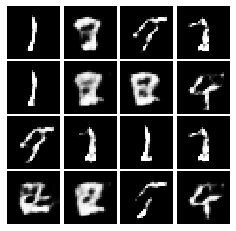

Epoch: 1, Iter: 900, D: 0.5072, G:3.163


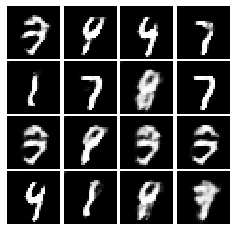

Epoch: 1, Iter: 920, D: 0.386, G:2.423


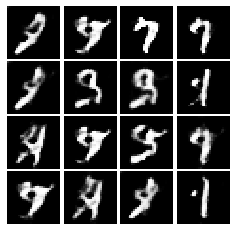

Epoch: 2, Iter: 940, D: 0.4354, G:2.174


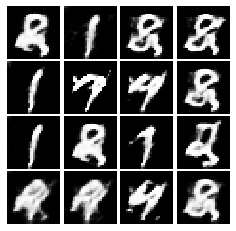

Epoch: 2, Iter: 960, D: 0.4754, G:2.551


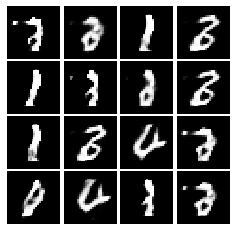

Epoch: 2, Iter: 980, D: 0.476, G:3.164


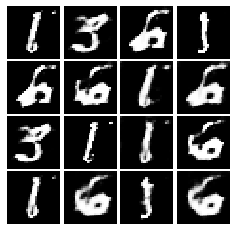

Epoch: 2, Iter: 1000, D: 0.2799, G:2.795


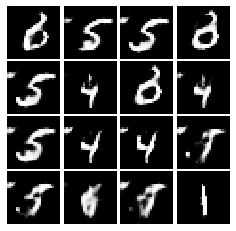

Epoch: 2, Iter: 1020, D: 0.2089, G:3.336


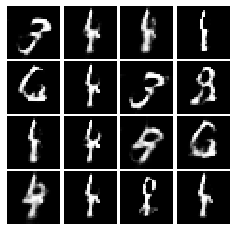

Epoch: 2, Iter: 1040, D: 0.7264, G:5.772


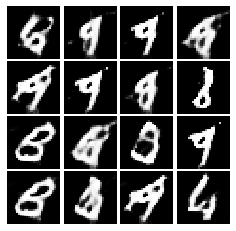

Epoch: 2, Iter: 1060, D: 0.4444, G:2.862


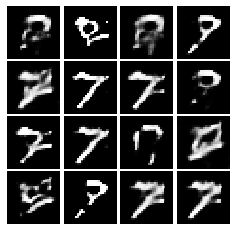

Epoch: 2, Iter: 1080, D: 0.3194, G:2.872


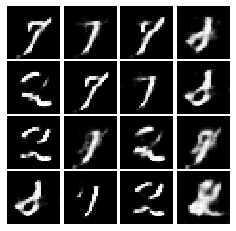

Epoch: 2, Iter: 1100, D: 0.613, G:2.751


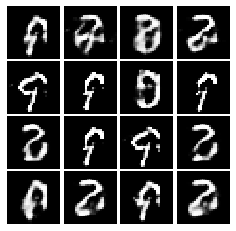

Epoch: 2, Iter: 1120, D: 0.4038, G:2.885


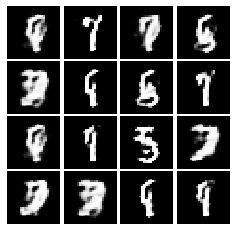

Epoch: 2, Iter: 1140, D: 0.436, G:2.796


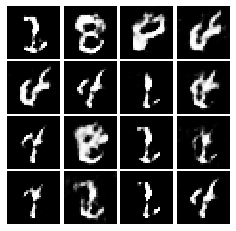

Epoch: 2, Iter: 1160, D: 0.2793, G:3.353


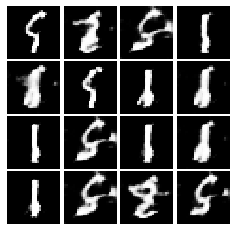

Epoch: 2, Iter: 1180, D: 0.4923, G:2.518


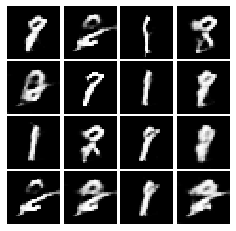

Epoch: 2, Iter: 1200, D: 0.5791, G:4.394


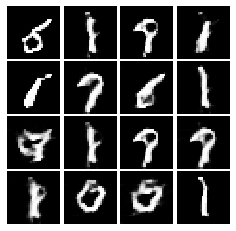

Epoch: 2, Iter: 1220, D: 0.5752, G:2.27


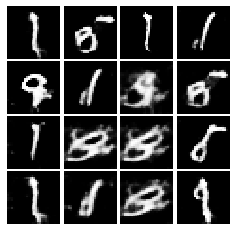

Epoch: 2, Iter: 1240, D: 0.4801, G:2.699


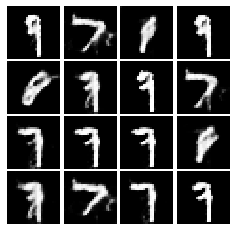

Epoch: 2, Iter: 1260, D: 0.5863, G:4.155


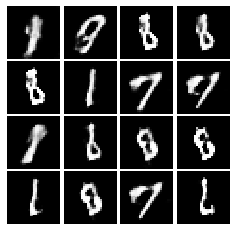

Epoch: 2, Iter: 1280, D: 0.4779, G:2.117


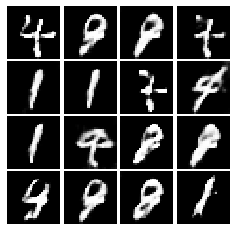

Epoch: 2, Iter: 1300, D: 0.4238, G:2.708


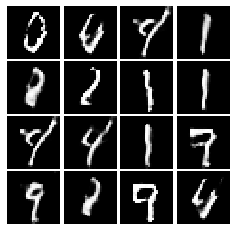

Epoch: 2, Iter: 1320, D: 0.4964, G:2.119


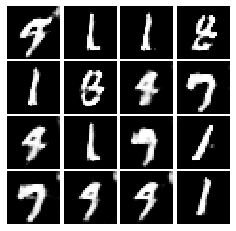

Epoch: 2, Iter: 1340, D: 0.568, G:2.615


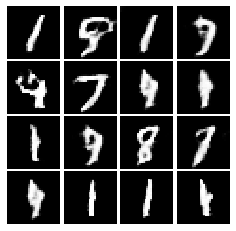

Epoch: 2, Iter: 1360, D: 0.424, G:2.471


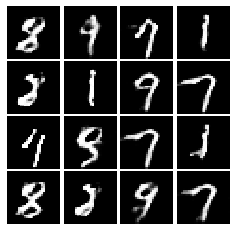

Epoch: 2, Iter: 1380, D: 0.3017, G:2.773


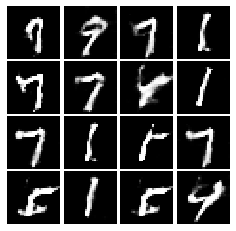

Epoch: 2, Iter: 1400, D: 0.574, G:3.236


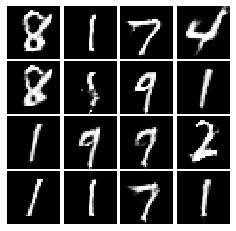

Epoch: 3, Iter: 1420, D: 0.5733, G:2.092


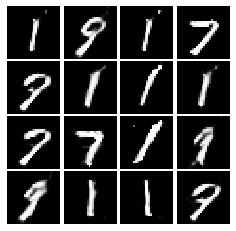

Epoch: 3, Iter: 1440, D: 0.5148, G:2.717


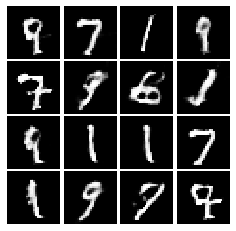

Epoch: 3, Iter: 1460, D: 0.4859, G:1.621


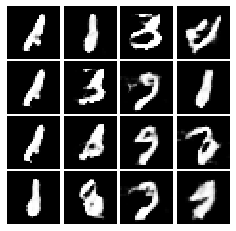

Epoch: 3, Iter: 1480, D: 0.4797, G:3.882


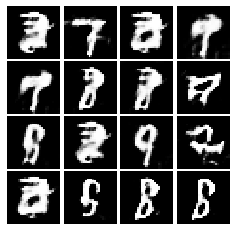

Epoch: 3, Iter: 1500, D: 0.8776, G:4.491


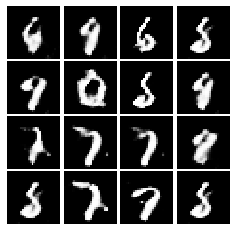

Epoch: 3, Iter: 1520, D: 0.4592, G:4.246


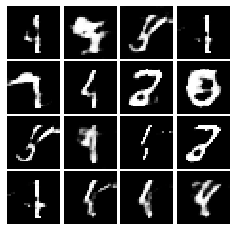

Epoch: 3, Iter: 1540, D: 0.3343, G:3.331


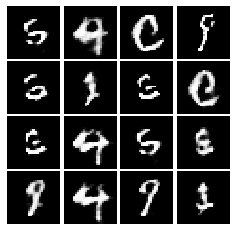

Epoch: 3, Iter: 1560, D: 0.3104, G:3.507


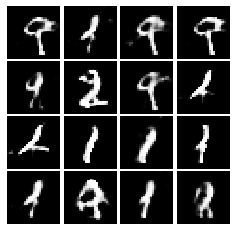

Epoch: 3, Iter: 1580, D: 0.4151, G:2.573


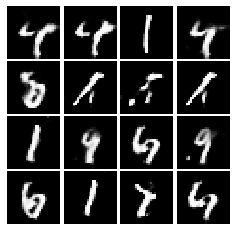

Epoch: 3, Iter: 1600, D: 0.6308, G:2.295


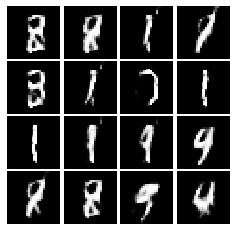

Epoch: 3, Iter: 1620, D: 0.4126, G:3.187


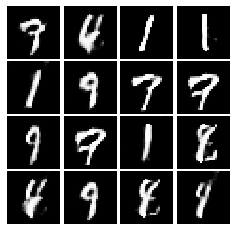

Epoch: 3, Iter: 1640, D: 0.4332, G:2.037


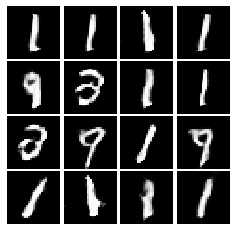

Epoch: 3, Iter: 1660, D: 0.5654, G:1.815


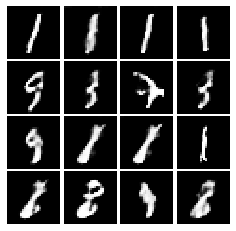

Epoch: 3, Iter: 1680, D: 0.4219, G:2.741


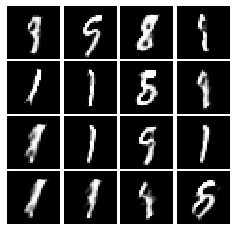

Epoch: 3, Iter: 1700, D: 0.7344, G:3.588


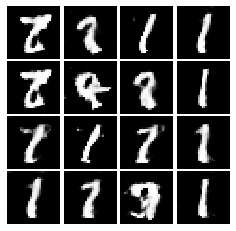

Epoch: 3, Iter: 1720, D: 0.5271, G:2.328


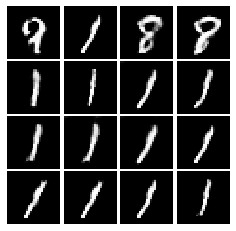

Epoch: 3, Iter: 1740, D: 0.5187, G:2.286


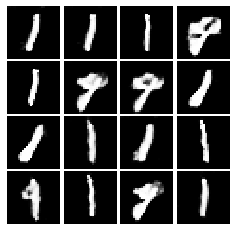

Epoch: 3, Iter: 1760, D: 0.3731, G:2.778


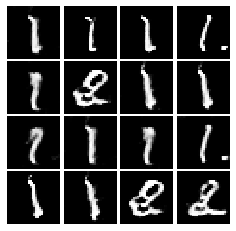

Epoch: 3, Iter: 1780, D: 0.4527, G:2.531


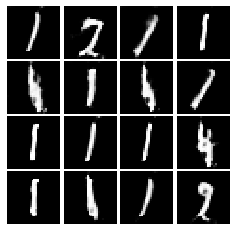

Epoch: 3, Iter: 1800, D: 0.3964, G:2.504


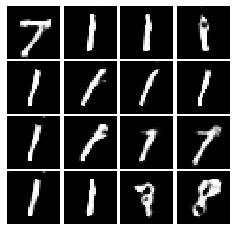

Epoch: 3, Iter: 1820, D: 0.7359, G:2.131


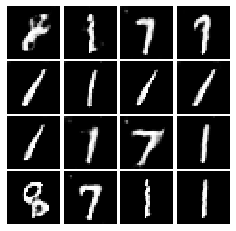

Epoch: 3, Iter: 1840, D: 0.5339, G:2.33


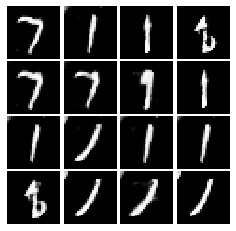

Epoch: 3, Iter: 1860, D: 0.449, G:2.371


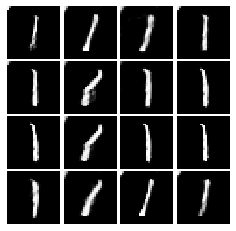

Epoch: 4, Iter: 1880, D: 0.4588, G:2.779


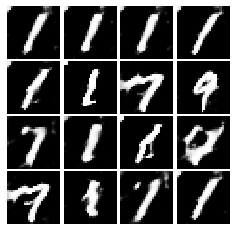

Epoch: 4, Iter: 1900, D: 0.3452, G:2.534


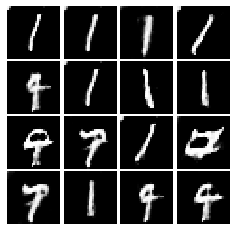

Epoch: 4, Iter: 1920, D: 0.5235, G:2.512


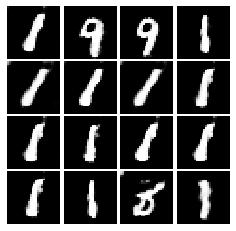

Epoch: 4, Iter: 1940, D: 0.8007, G:5.201


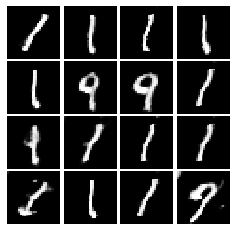

Epoch: 4, Iter: 1960, D: 0.4368, G:2.162


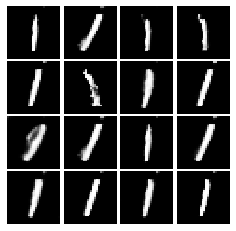

Epoch: 4, Iter: 1980, D: 0.3787, G:2.732


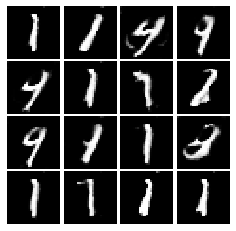

Epoch: 4, Iter: 2000, D: 0.809, G:2.219


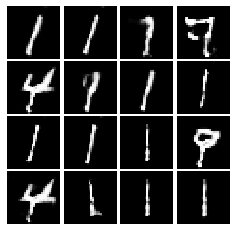

Epoch: 4, Iter: 2020, D: 0.48, G:2.876


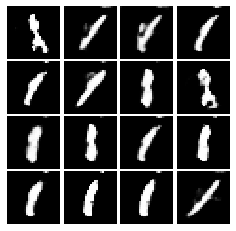

Epoch: 4, Iter: 2040, D: 0.511, G:2.229


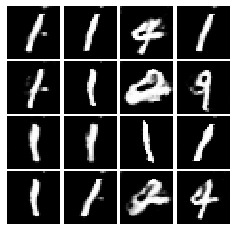

Epoch: 4, Iter: 2060, D: 0.4027, G:2.163


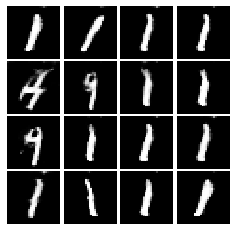

Epoch: 4, Iter: 2080, D: 0.5489, G:2.296


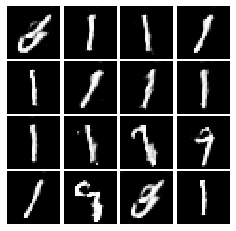

Epoch: 4, Iter: 2100, D: 0.4691, G:2.754


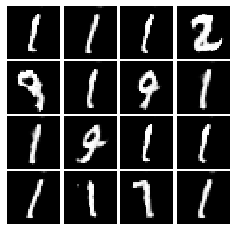

Epoch: 4, Iter: 2120, D: 0.6205, G:2.375


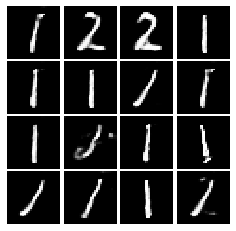

Epoch: 4, Iter: 2140, D: 0.4054, G:2.542


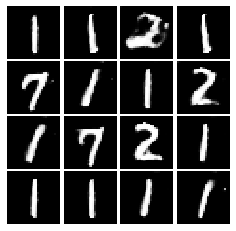

Epoch: 4, Iter: 2160, D: 0.4641, G:3.002


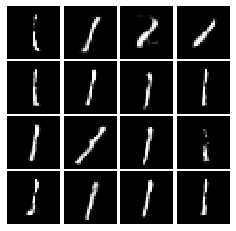

Epoch: 4, Iter: 2180, D: 0.3865, G:2.981


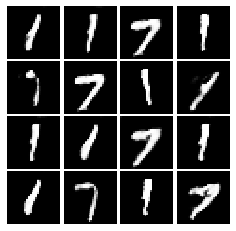

Epoch: 4, Iter: 2200, D: 0.7615, G:2.286


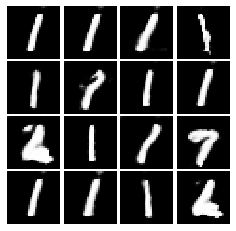

Epoch: 4, Iter: 2220, D: 0.5452, G:2.255


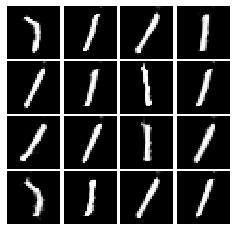

Epoch: 4, Iter: 2240, D: 0.3915, G:2.309


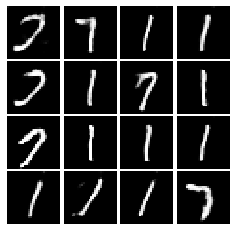

Epoch: 4, Iter: 2260, D: 0.5801, G:2.092


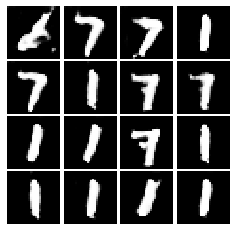

Epoch: 4, Iter: 2280, D: 0.5062, G:2.477


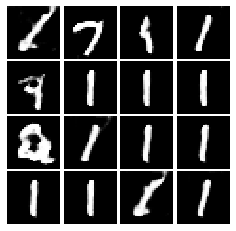

Epoch: 4, Iter: 2300, D: 0.5646, G:2.599


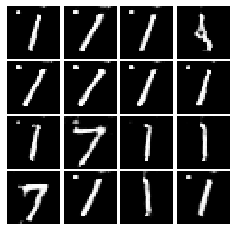

Epoch: 4, Iter: 2320, D: 0.4092, G:2.409


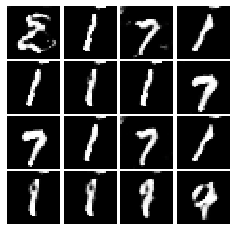

Epoch: 4, Iter: 2340, D: 0.5355, G:2.292


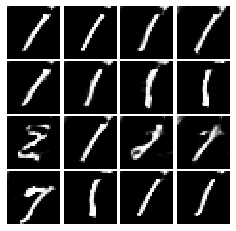

Final images


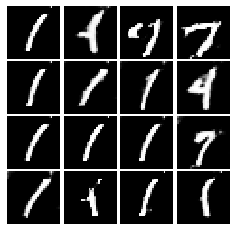

In [204]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)